In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import KNNImputer
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
import scipy.stats as stats
from sklearn.metrics import classification_report , accuracy_score , recall_score
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import joblib

In [2]:
df=pd.read_csv("C:/Users/suyas/Desktop/New folder/Project/Credit/Customer_Data.csv")

C:\Users\suyas\AppData\Local\Temp\ipykernel_21952\2159750200.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("C:/Users/suyas/Desktop/New folder/Project/Credit/Customer_Data.csv")


In [3]:
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,Good,502.38,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ID                       100000 non-null  object 
 1   Customer_ID              100000 non-null  object 
 2   Month                    100000 non-null  object 
 3   Name                     90015 non-null   object 
 4   Age                      100000 non-null  object 
 5   SSN                      100000 non-null  object 
 6   Occupation               100000 non-null  object 
 7   Annual_Income            100000 non-null  object 
 8   Monthly_Inhand_Salary    84998 non-null   float64
 9   Num_Bank_Accounts        100000 non-null  int64  
 10  Interest_Rate            100000 non-null  int64  
 11  Num_of_Loan              100000 non-null  object 
 12  Type_of_Loan             88592 non-null   object 
 13  Delay_from_due_date      100000 non-null  int64  
 14  Num_o

In [5]:
df.shape

(100000, 25)

In [6]:
df.dtypes

ID                          object
Customer_ID                 object
Month                       object
Name                        object
Age                         object
SSN                         object
Occupation                  object
Annual_Income               object
Monthly_Inhand_Salary      float64
Num_Bank_Accounts            int64
Interest_Rate                int64
Num_of_Loan                 object
Type_of_Loan                object
Delay_from_due_date          int64
Num_of_Delayed_Payment      object
Num_Credit_Inquiries       float64
Credit_Mix                  object
Outstanding_Debt            object
Credit_History_Age          object
Payment_of_Min_Amount       object
Total_EMI_per_month        float64
Amount_invested_monthly     object
Payment_Behaviour           object
Monthly_Balance             object
Credit_Score                object
dtype: object

In [7]:
df.isnull().sum()/len(df)*100

ID                          0.000
Customer_ID                 0.000
Month                       0.000
Name                        9.985
Age                         0.000
SSN                         0.000
Occupation                  0.000
Annual_Income               0.000
Monthly_Inhand_Salary      15.002
Num_Bank_Accounts           0.000
Interest_Rate               0.000
Num_of_Loan                 0.000
Type_of_Loan               11.408
Delay_from_due_date         0.000
Num_of_Delayed_Payment      7.002
Num_Credit_Inquiries        1.965
Credit_Mix                  0.000
Outstanding_Debt            0.000
Credit_History_Age          9.030
Payment_of_Min_Amount       0.000
Total_EMI_per_month         0.000
Amount_invested_monthly     4.479
Payment_Behaviour           0.000
Monthly_Balance             1.200
Credit_Score                0.000
dtype: float64

In [8]:
dfnew=df.dropna()
dfnew

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28_,004-07-5839,_______,34847.84,3037.986667,2,...,2.0,Good,605.03,26 Years and 7 Months,No,18.816215,104.2918252,Low_spent_Small_value_payments,470.69062692529184,Standard
9,0x160f,CUS_0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,2.0,Good,605.03,26 Years and 8 Months,No,18.816215,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good
10,0x1610,CUS_0x21b1,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.84_,3037.986667,2,...,2.0,_,605.03,26 Years and 9 Months,No,18.816215,58.51597569589465,High_spent_Large_value_payments,466.46647639764313,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,0x25fe8,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 5 Months,No,35.104023,140.58140274528395,High_spent_Medium_value_payments,410.256158,Poor
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor


In [9]:
dfnew.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53049 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       53049 non-null  object 
 1   Customer_ID              53049 non-null  object 
 2   Month                    53049 non-null  object 
 3   Name                     53049 non-null  object 
 4   Age                      53049 non-null  object 
 5   SSN                      53049 non-null  object 
 6   Occupation               53049 non-null  object 
 7   Annual_Income            53049 non-null  object 
 8   Monthly_Inhand_Salary    53049 non-null  float64
 9   Num_Bank_Accounts        53049 non-null  int64  
 10  Interest_Rate            53049 non-null  int64  
 11  Num_of_Loan              53049 non-null  object 
 12  Type_of_Loan             53049 non-null  object 
 13  Delay_from_due_date      53049 non-null  int64  
 14  Num_of_Delayed_Payment

In [10]:
data_lost=(len(df)-len(dfnew))*100/len(df)
f"Data Lost-{data_lost:0.2f} %"

'Data Lost-46.95 %'

In [11]:
df.drop("Name",axis=1,inplace=True)

In [12]:

df.head()

,ID,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Interest_Rate,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,23,821-00-0265,Scientist,19114.12,1824.843333,3,3,...,4.0,_,809.98,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,23,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,-500,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,23,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,23,821-00-0265,Scientist,19114.12,1824.843333,3,3,...,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ID                       100000 non-null  object 
 1   Customer_ID              100000 non-null  object 
 2   Month                    100000 non-null  object 
 3   Age                      100000 non-null  object 
 4   SSN                      100000 non-null  object 
 5   Occupation               100000 non-null  object 
 6   Annual_Income            100000 non-null  object 
 7   Monthly_Inhand_Salary    84998 non-null   float64
 8   Num_Bank_Accounts        100000 non-null  int64  
 9   Interest_Rate            100000 non-null  int64  
 10  Num_of_Loan              100000 non-null  object 
 11  Type_of_Loan             88592 non-null   object 
 12  Delay_from_due_date      100000 non-null  int64  
 13  Num_of_Delayed_Payment   92998 non-null   object 
 14  Num_C

In [14]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


# ---------------Credit_Score------------------

In [15]:
df["Credit_Score"]

0            Good
1            Good
2            Good
3            Good
4            Good
           ...   
99995        Poor
99996        Poor
99997        Poor
99998    Standard
99999        Poor
Name: Credit_Score, Length: 100000, dtype: object

In [16]:
from sklearn.preprocessing import LabelEncoder
lb=LabelEncoder()
df["credit__score_label"]=lb.fit_transform(df["Credit_Score"])

good=0 standard=2 poor=1

In [17]:
df.drop("Credit_Score",axis=1,inplace=True)

In [18]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'credit__score_label'],
      dtype='object')

here a lot of columns are out of model scope ,redundant and not so useful in this particular context of the issue at the hand so we have to drop them,name column was already dropped

In [19]:
drop_df = df.drop(['ID','Customer_ID','Month','SSN','Num_Bank_Accounts',
         'Interest_Rate','Num_of_Loan','Type_of_Loan','Amount_invested_monthly'], axis=1).copy()
drop_df

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,credit__score_label
0,23,Scientist,19114.12,1824.843333,3,7,4.0,_,809.98,22 Years and 1 Months,No,49.574949,High_spent_Small_value_payments,312.49408867943663,0
1,23,Scientist,19114.12,NaN,-1,NaN,4.0,Good,809.98,NaN,No,49.574949,Low_spent_Large_value_payments,284.62916249607184,0
2,-500,Scientist,19114.12,NaN,3,7,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,Low_spent_Medium_value_payments,331.2098628537912,0
3,23,Scientist,19114.12,NaN,5,4,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,Low_spent_Small_value_payments,223.45130972736786,0
4,23,Scientist,19114.12,1824.843333,6,NaN,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,High_spent_Medium_value_payments,341.48923103222177,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25,Mechanic,39628.99,3359.415833,23,7,3.0,_,502.38,31 Years and 6 Months,No,35.104023,High_spent_Large_value_payments,479.866228,1
99996,25,Mechanic,39628.99,3359.415833,18,7,3.0,_,502.38,31 Years and 7 Months,No,35.104023,High_spent_Medium_value_payments,496.65161,1
99997,25,Mechanic,39628.99,3359.415833,27,6,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,High_spent_Large_value_payments,516.809083,1
99998,25,Mechanic,39628.99,3359.415833,20,NaN,3.0,Good,502.38,31 Years and 9 Months,No,35.104023,Low_spent_Large_value_payments,319.164979,2


# ----------AGE----------------

In [20]:
drop_df["Age"]

0          23
1          23
2        -500
3          23
4          23
         ... 
99995      25
99996      25
99997      25
99998      25
99999      25
Name: Age, Length: 100000, dtype: object

In [21]:
def filter_col(value):
    if '-' in value:
        return value.split('-')[1]
    elif '_' in value:
        return value.split('_')[0]
    else:
        return value

In [22]:
type(df["Age"])

pandas.core.series.Series

In [23]:
drop_df["Age"] = drop_df["Age"].apply(filter_col)
drop_df["Age"] = drop_df["Age"].astype(int)

In [24]:
for i in range(len(drop_df["Age"])):
    if drop_df["Age"][i] > 90 or drop_df["Age"][i] < 10:
        drop_df["Age"][i] = np.nan
    else:
        drop_df["Age"][i] = drop_df["Age"][i]

C:\Users\suyas\AppData\Local\Temp\ipykernel_21952\2827531744.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_df["Age"][i] = drop_df["Age"][i]
C:\Users\suyas\AppData\Local\Temp\ipykernel_21952\2827531744.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_df["Age"][i] = np.nan


In [25]:
drop_df["Age"]

0        23.0
1        23.0
2         NaN
3        23.0
4        23.0
         ... 
99995    25.0
99996    25.0
99997    25.0
99998    25.0
99999    25.0
Name: Age, Length: 100000, dtype: float64

In [26]:
drop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Age                     97219 non-null   float64
 1   Occupation              100000 non-null  object 
 2   Annual_Income           100000 non-null  object 
 3   Monthly_Inhand_Salary   84998 non-null   float64
 4   Delay_from_due_date     100000 non-null  int64  
 5   Num_of_Delayed_Payment  92998 non-null   object 
 6   Num_Credit_Inquiries    98035 non-null   float64
 7   Credit_Mix              100000 non-null  object 
 8   Outstanding_Debt        100000 non-null  object 
 9   Credit_History_Age      90970 non-null   object 
 10  Payment_of_Min_Amount   100000 non-null  object 
 11  Total_EMI_per_month     100000 non-null  float64
 12  Payment_Behaviour       100000 non-null  object 
 13  Monthly_Balance         98800 non-null   object 
 14  credit__score_label  

In [27]:
drop_df["Occupation"].value_counts()

_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

In [28]:
drop_df["Occupation"].replace("_______",np.nan,inplace=True)

In [29]:
drop_df["Occupation"]=drop_df["Occupation"].astype("object")

In [30]:
drop_df["Occupation"].value_counts()

Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

In [31]:
drop_df

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,credit__score_label
0,23.0,Scientist,19114.12,1824.843333,3,7,4.0,_,809.98,22 Years and 1 Months,No,49.574949,High_spent_Small_value_payments,312.49408867943663,0
1,23.0,Scientist,19114.12,NaN,-1,NaN,4.0,Good,809.98,NaN,No,49.574949,Low_spent_Large_value_payments,284.62916249607184,0
2,NaN,Scientist,19114.12,NaN,3,7,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,Low_spent_Medium_value_payments,331.2098628537912,0
3,23.0,Scientist,19114.12,NaN,5,4,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,Low_spent_Small_value_payments,223.45130972736786,0
4,23.0,Scientist,19114.12,1824.843333,6,NaN,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,High_spent_Medium_value_payments,341.48923103222177,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25.0,Mechanic,39628.99,3359.415833,23,7,3.0,_,502.38,31 Years and 6 Months,No,35.104023,High_spent_Large_value_payments,479.866228,1
99996,25.0,Mechanic,39628.99,3359.415833,18,7,3.0,_,502.38,31 Years and 7 Months,No,35.104023,High_spent_Medium_value_payments,496.65161,1
99997,25.0,Mechanic,39628.99,3359.415833,27,6,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,High_spent_Large_value_payments,516.809083,1
99998,25.0,Mechanic,39628.99,3359.415833,20,NaN,3.0,Good,502.38,31 Years and 9 Months,No,35.104023,Low_spent_Large_value_payments,319.164979,2


In [32]:
krna=['Age', 'Occupation', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries']

# -------------------------Delay_from_due_date--------------------------

In [33]:
drop_df["Delay_from_due_date"].value_counts().sort_index()

-5      33
-4      62
-3     118
-2     168
-1     210
      ... 
 63     69
 64     64
 65     56
 66     32
 67     22
Name: Delay_from_due_date, Length: 73, dtype: int64

In [34]:
drop_df["Delay_from_due_date"].isnull().sum()

0

In [35]:
drop_df["Delay_from_due_date"] = drop_df["Delay_from_due_date"].apply(lambda x: max(x, 0))

# ------------------Num_of_Delayed_Payment-----------------------

In [36]:
drop_df["Num_of_Delayed_Payment"].isnull().sum()

7002

Here the Num_of_Delayed_Payment columns has around 7k null values dropping them dirctly could mean a significant data loss. Also directly imputating it with mean is also a bad idea consdering the fact that it could be depended on some other factor. So insted we will see the correleation of this column with other variables and then decide which column should be used to take out some metric.

In [37]:
def filter_(value:str):
    if '_' in str(value):
        return value.split('_')[0]
    else:
        return value
drop_df["Num_of_Delayed_Payment"]= drop_df["Num_of_Delayed_Payment"].apply(filter_)

In [38]:
drop_df["Num_of_Delayed_Payment"]= drop_df["Num_of_Delayed_Payment"].astype("float64")

In [39]:
drop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Age                     97219 non-null   float64
 1   Occupation              92938 non-null   object 
 2   Annual_Income           100000 non-null  object 
 3   Monthly_Inhand_Salary   84998 non-null   float64
 4   Delay_from_due_date     100000 non-null  int64  
 5   Num_of_Delayed_Payment  92998 non-null   float64
 6   Num_Credit_Inquiries    98035 non-null   float64
 7   Credit_Mix              100000 non-null  object 
 8   Outstanding_Debt        100000 non-null  object 
 9   Credit_History_Age      90970 non-null   object 
 10  Payment_of_Min_Amount   100000 non-null  object 
 11  Total_EMI_per_month     100000 non-null  float64
 12  Payment_Behaviour       100000 non-null  object 
 13  Monthly_Balance         98800 non-null   object 
 14  credit__score_label  

# ------------Num_Credit_Inquiries-----------------

In [40]:
drop_df["Num_Credit_Inquiries"].isnull().sum()

1965

# -------------------Annual_Income------------------

In [41]:
drop_df["Annual_Income"].value_counts()

36585.12     16
20867.67     16
17273.83     16
9141.63      15
33029.66     15
             ..
20269.93_     1
15157.25_     1
44955.64_     1
76650.12_     1
4262933       1
Name: Annual_Income, Length: 18940, dtype: int64

In [42]:
drop_df["Annual_Income"] = drop_df["Annual_Income"].apply(filter_col)
drop_df["Annual_Income"] = drop_df["Annual_Income"].astype(float)

In [43]:
drop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Age                     97219 non-null   float64
 1   Occupation              92938 non-null   object 
 2   Annual_Income           100000 non-null  float64
 3   Monthly_Inhand_Salary   84998 non-null   float64
 4   Delay_from_due_date     100000 non-null  int64  
 5   Num_of_Delayed_Payment  92998 non-null   float64
 6   Num_Credit_Inquiries    98035 non-null   float64
 7   Credit_Mix              100000 non-null  object 
 8   Outstanding_Debt        100000 non-null  object 
 9   Credit_History_Age      90970 non-null   object 
 10  Payment_of_Min_Amount   100000 non-null  object 
 11  Total_EMI_per_month     100000 non-null  float64
 12  Payment_Behaviour       100000 non-null  object 
 13  Monthly_Balance         98800 non-null   object 
 14  credit__score_label  

In [44]:
krna=[ 'Occupation', 
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
        
        
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
      'Total_EMI_per_month', 

      
      'Payment_Behaviour', 'Monthly_Balance']

# -----------------Monthly_Balance-----------------

In [45]:
drop_df["Monthly_Balance"].isnull().sum()

1200

In [46]:
drop_df["Monthly_Balance"].value_counts()

__-333333333333333333333333333__    9
312.49408867943663                  1
415.32532309844316                  1
252.08489793906085                  1
254.9709216273975                   1
                                   ..
366.2890379762706                   1
151.1882696261166                   1
306.75027851710234                  1
278.8720257394474                   1
393.6736955618808                   1
Name: Monthly_Balance, Length: 98792, dtype: int64

In [47]:
drop_df['Monthly_Balance']=drop_df['Monthly_Balance'].replace('__-333333333333333333333333333__',np.nan)
drop_df['Monthly_Balance']=drop_df['Monthly_Balance'].astype("float")

In [48]:
drop_df['Monthly_Balance']=drop_df['Monthly_Balance'].fillna(drop_df["Monthly_Balance"].mean())
drop_df['Monthly_Balance']=drop_df['Monthly_Balance'].round(3)

In [49]:
drop_df["Monthly_Balance"].isnull().sum()

0

# ---------------Credit_History_Age------------------

In [50]:
years  = []
months = []
for value in drop_df["Credit_History_Age"]:
    if value is np.nan:
        years.append(np.nan)
        months.append(np.nan)
    else:
        new_str = value.lower().split()
        years_ = int(new_str[0])
        months_ = int(new_str[new_str.index('and')+1])
        years.append(years_)
        months.append(months_)
drop_df['Credit_Age_years'] = pd.Series(years)
drop_df['Credit_Age_months'] = pd.Series(months) 
drop_df.drop('Credit_History_Age',axis=1,inplace=True)

In [51]:
drop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Age                     97219 non-null   float64
 1   Occupation              92938 non-null   object 
 2   Annual_Income           100000 non-null  float64
 3   Monthly_Inhand_Salary   84998 non-null   float64
 4   Delay_from_due_date     100000 non-null  int64  
 5   Num_of_Delayed_Payment  92998 non-null   float64
 6   Num_Credit_Inquiries    98035 non-null   float64
 7   Credit_Mix              100000 non-null  object 
 8   Outstanding_Debt        100000 non-null  object 
 9   Payment_of_Min_Amount   100000 non-null  object 
 10  Total_EMI_per_month     100000 non-null  float64
 11  Payment_Behaviour       100000 non-null  object 
 12  Monthly_Balance         100000 non-null  float64
 13  credit__score_label     100000 non-null  int32  
 14  Credit_Age_years     

# -----------Credit_Mix------------------

In [52]:
drop_df["Credit_Mix"].value_counts()

Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64

In [53]:
drop_df['Credit_Mix']=drop_df['Credit_Mix'].replace('_',np.nan)

In [54]:
lc=LabelEncoder()
drop_df["Credit_Mix"]=lc.fit_transform(drop_df["Credit_Mix"])

In [55]:
drop_df["Credit_Mix"].value_counts()

2    36479
1    24337
3    20195
0    18989
Name: Credit_Mix, dtype: int64

# --------------Payment_Behaviour----------------

In [56]:
drop_df["Payment_Behaviour"].value_counts()

Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: Payment_Behaviour, dtype: int64

In [57]:
drop_df["Payment_Behaviour"]=drop_df["Payment_Behaviour"].replace("!@9#%8",np.nan)

In [58]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
drop_df["Payment_Behaviour"]=l.fit_transform(drop_df["Payment_Behaviour"])

In [59]:
drop_df["Payment_Behaviour"].ffill(inplace=True)

In [60]:
drop_df["Payment_Behaviour"]=drop_df["Payment_Behaviour"].astype("int64")

# ---------------Outstanding_Debt------------------------

In [61]:
drop_df["Outstanding_Debt"].isna().sum()

0

In [62]:
drop_df["Outstanding_Debt"].value_counts()

1360.45     24
460.46      23
1151.7      23
1109.03     23
467.7       16
            ..
245.46_      1
645.77_      1
174.79_      1
1181.13_     1
1013.53_     1
Name: Outstanding_Debt, Length: 13178, dtype: int64

In [63]:
drop_df["Outstanding_Debt"] = drop_df["Outstanding_Debt"].apply(filter_col)
drop_df["Outstanding_Debt"] = drop_df["Outstanding_Debt"].astype(float)

In [64]:
drop_df["Outstanding_Debt"].value_counts()

1109.03    24
1151.70    24
1360.45    24
460.46     24
1058.13    16
           ..
4230.04     8
641.99      8
98.61       8
2614.48     8
502.38      8
Name: Outstanding_Debt, Length: 12203, dtype: int64

# ------------------Num_Credit_Inquiries---------------------

In [65]:
drop_df["Num_Credit_Inquiries"].value_counts()

4.0       11271
3.0        8890
6.0        8111
7.0        8058
2.0        8028
          ...  
1721.0        1
1750.0        1
2397.0        1
621.0         1
74.0          1
Name: Num_Credit_Inquiries, Length: 1223, dtype: int64

In [66]:
(drop_df["Num_Credit_Inquiries"]<0).sum()

0

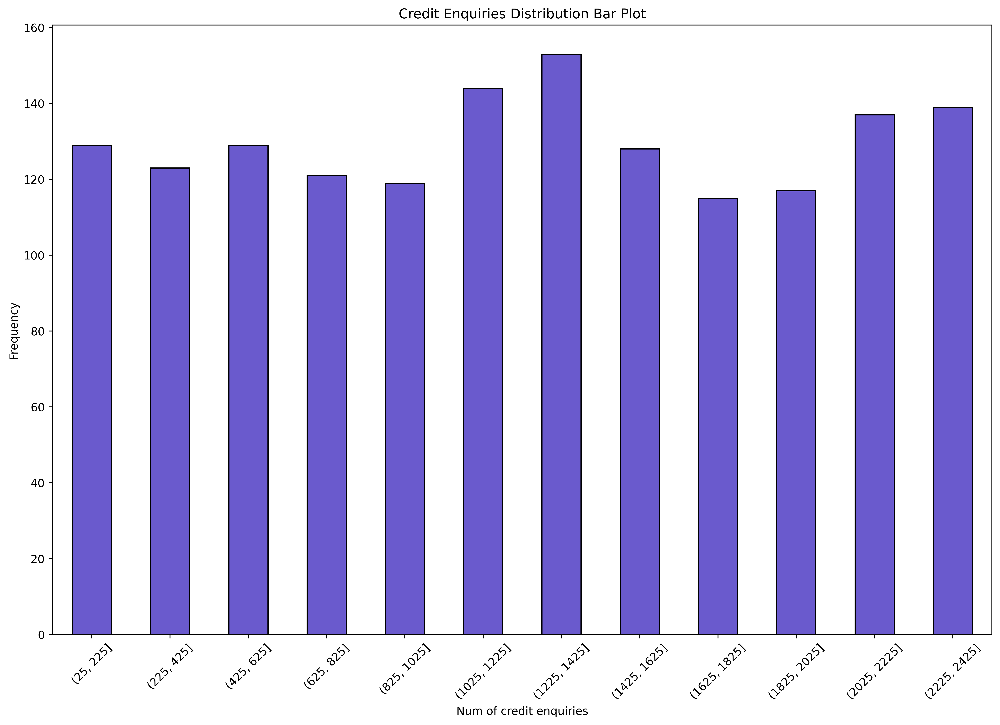

In [67]:
age_bins = range(25,2600,200)  # Define your age ranges
plt.figure(figsize=(15,10),dpi=500)

# Use pd.cut to categorize ages into bins and get the frequency count
delay_ranges = pd.cut(drop_df["Num_Credit_Inquiries"], bins=age_bins)
delay_counts = delay_ranges.value_counts().sort_index()

# Create a bar plot
delay_counts.plot(kind='bar', color='slateblue', edgecolor='black')

# Customize the plot
plt.xlabel('Num of credit enquiries')
plt.ylabel('Frequency')
plt.title('Credit Enquiries Distribution Bar Plot')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# ------------------Total_EMI_per_month----------------------

In [68]:
drop_df["Total_EMI_per_month"]=drop_df["Total_EMI_per_month"].astype("float").round(3)

In [69]:
drop_df

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,credit__score_label,Credit_Age_years,Credit_Age_months
0,23.0,Scientist,19114.12,1824.843333,3,7.0,4.0,3,809.98,No,49.575,2,312.494,0,22.0,1.0
1,23.0,Scientist,19114.12,NaN,0,NaN,4.0,1,809.98,No,49.575,3,284.629,0,NaN,NaN
2,NaN,Scientist,19114.12,NaN,3,7.0,4.0,1,809.98,No,49.575,4,331.210,0,22.0,3.0
3,23.0,Scientist,19114.12,NaN,5,4.0,4.0,1,809.98,No,49.575,5,223.451,0,22.0,4.0
4,23.0,Scientist,19114.12,1824.843333,6,NaN,4.0,1,809.98,No,49.575,1,341.489,0,22.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25.0,Mechanic,39628.99,3359.415833,23,7.0,3.0,3,502.38,No,35.104,0,479.866,1,31.0,6.0
99996,25.0,Mechanic,39628.99,3359.415833,18,7.0,3.0,3,502.38,No,35.104,1,496.652,1,31.0,7.0
99997,25.0,Mechanic,39628.99,3359.415833,27,6.0,3.0,1,502.38,No,35.104,0,516.809,1,31.0,8.0
99998,25.0,Mechanic,39628.99,3359.415833,20,NaN,3.0,1,502.38,No,35.104,3,319.165,2,31.0,9.0


In [70]:
drop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Age                     97219 non-null   float64
 1   Occupation              92938 non-null   object 
 2   Annual_Income           100000 non-null  float64
 3   Monthly_Inhand_Salary   84998 non-null   float64
 4   Delay_from_due_date     100000 non-null  int64  
 5   Num_of_Delayed_Payment  92998 non-null   float64
 6   Num_Credit_Inquiries    98035 non-null   float64
 7   Credit_Mix              100000 non-null  int32  
 8   Outstanding_Debt        100000 non-null  float64
 9   Payment_of_Min_Amount   100000 non-null  object 
 10  Total_EMI_per_month     100000 non-null  float64
 11  Payment_Behaviour       100000 non-null  int64  
 12  Monthly_Balance         100000 non-null  float64
 13  credit__score_label     100000 non-null  int32  
 14  Credit_Age_years     

In [71]:
drop_df.columns

Index(['Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
       'Credit_Mix', 'Outstanding_Debt', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Payment_Behaviour', 'Monthly_Balance',
       'credit__score_label', 'Credit_Age_years', 'Credit_Age_months'],
      dtype='object')

In [72]:
drop_df.isnull().sum()

Age                        2781
Occupation                 7062
Annual_Income                 0
Monthly_Inhand_Salary     15002
Delay_from_due_date           0
Num_of_Delayed_Payment     7002
Num_Credit_Inquiries       1965
Credit_Mix                    0
Outstanding_Debt              0
Payment_of_Min_Amount         0
Total_EMI_per_month           0
Payment_Behaviour             0
Monthly_Balance               0
credit__score_label           0
Credit_Age_years           9030
Credit_Age_months          9030
dtype: int64

using forward fill (ffill) to impute missing values in the "Occupation" column based on the context of the "Monthly_Inhand_Salary" values. Forward fill is a method commonly used to propagate the last valid observation forward to fill gaps in the data.

In [73]:
drop_df["Monthly_Inhand_Salary"].value_counts().head(20) 

6769.130000     15
6358.956667     15
2295.058333     15
6082.187500     15
3080.555000     14
4387.272500     13
5766.491667     13
6639.560000     13
536.431250      12
1315.560833     11
2557.861667      9
1476.062917      8
2610.171667      8
9641.480000      8
11624.846667     8
1393.486667      8
1801.474167      8
7554.577500      8
1365.173333      8
1474.625417      8
Name: Monthly_Inhand_Salary, dtype: int64

In [74]:
drop_df.loc[drop_df["Monthly_Inhand_Salary"] ==1359.206250, "Occupation"]

59144    Manager
59145    Manager
59146        NaN
59147    Manager
59148    Manager
59149    Manager
59150    Manager
59151    Manager
Name: Occupation, dtype: object

In [75]:
drop_df['Occupation'].ffill(inplace=True)

In [76]:
drop_df["Monthly_Inhand_Salary"].value_counts().head(10)
drop_df.loc[drop_df["Monthly_Inhand_Salary"] ==1359.206250, "Occupation"] 
drop_df.drop('Monthly_Inhand_Salary',axis=1,inplace=True)

In [77]:
encoder = OneHotEncoder()
encoded_pay_min_amt= encoder.fit_transform(drop_df[["Payment_of_Min_Amount"]])
df_encoded = pd.DataFrame(encoded_pay_min_amt.toarray(), columns=encoder.get_feature_names_out(["Payment_of_Min_Amount"]))
combined_df = pd.concat([drop_df, df_encoded], axis=1)
combined_df.drop('Payment_of_Min_Amount',axis=1,inplace=True)

In [78]:
drop_df.isnull().sum()

Age                       2781
Occupation                   0
Annual_Income                0
Delay_from_due_date          0
Num_of_Delayed_Payment    7002
Num_Credit_Inquiries      1965
Credit_Mix                   0
Outstanding_Debt             0
Payment_of_Min_Amount        0
Total_EMI_per_month          0
Payment_Behaviour            0
Monthly_Balance              0
credit__score_label          0
Credit_Age_years          9030
Credit_Age_months         9030
dtype: int64

<AxesSubplot:>

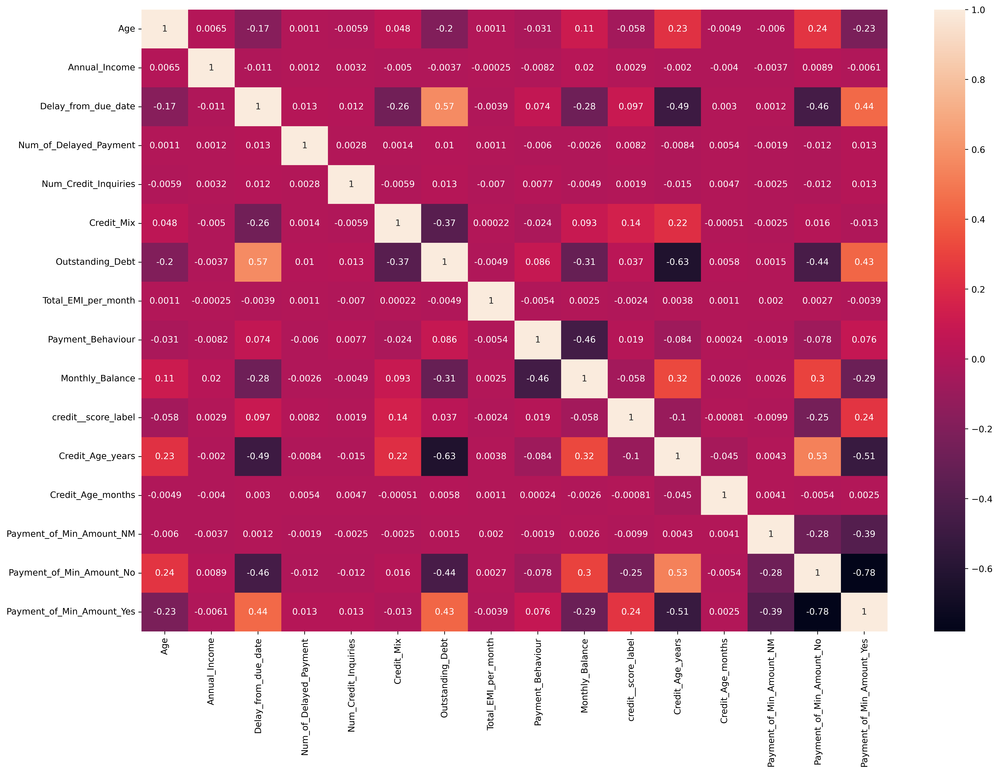

In [79]:
plt.figure(figsize=(19,13),dpi=500)
sns.heatmap(combined_df.corr(),annot=True)

In [80]:
combined_df.columns

Index(['Age', 'Occupation', 'Annual_Income', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Total_EMI_per_month', 'Payment_Behaviour',
       'Monthly_Balance', 'credit__score_label', 'Credit_Age_years',
       'Credit_Age_months', 'Payment_of_Min_Amount_NM',
       'Payment_of_Min_Amount_No', 'Payment_of_Min_Amount_Yes'],
      dtype='object')

In [81]:
combined_df['credit__score_label'] = combined_df.pop("credit__score_label")

In [82]:
combined_df.head()

,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,credit__score_label
0,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0,0
1,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0,0
2,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0,0
3,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0,0
4,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0,0


In [83]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 17 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Age                        97219 non-null   float64
 1   Occupation                 100000 non-null  object 
 2   Annual_Income              100000 non-null  float64
 3   Delay_from_due_date        100000 non-null  int64  
 4   Num_of_Delayed_Payment     92998 non-null   float64
 5   Num_Credit_Inquiries       98035 non-null   float64
 6   Credit_Mix                 100000 non-null  int32  
 7   Outstanding_Debt           100000 non-null  float64
 8   Total_EMI_per_month        100000 non-null  float64
 9   Payment_Behaviour          100000 non-null  int64  
 10  Monthly_Balance            100000 non-null  float64
 11  Credit_Age_years           90970 non-null   float64
 12  Credit_Age_months          90970 non-null   float64
 13  Payment_of_Min_Amount_NM   100

In [84]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 17 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Age                        97219 non-null   float64
 1   Occupation                 100000 non-null  object 
 2   Annual_Income              100000 non-null  float64
 3   Delay_from_due_date        100000 non-null  int64  
 4   Num_of_Delayed_Payment     92998 non-null   float64
 5   Num_Credit_Inquiries       98035 non-null   float64
 6   Credit_Mix                 100000 non-null  int32  
 7   Outstanding_Debt           100000 non-null  float64
 8   Total_EMI_per_month        100000 non-null  float64
 9   Payment_Behaviour          100000 non-null  int64  
 10  Monthly_Balance            100000 non-null  float64
 11  Credit_Age_years           90970 non-null   float64
 12  Credit_Age_months          90970 non-null   float64
 13  Payment_of_Min_Amount_NM   100

<AxesSubplot:>

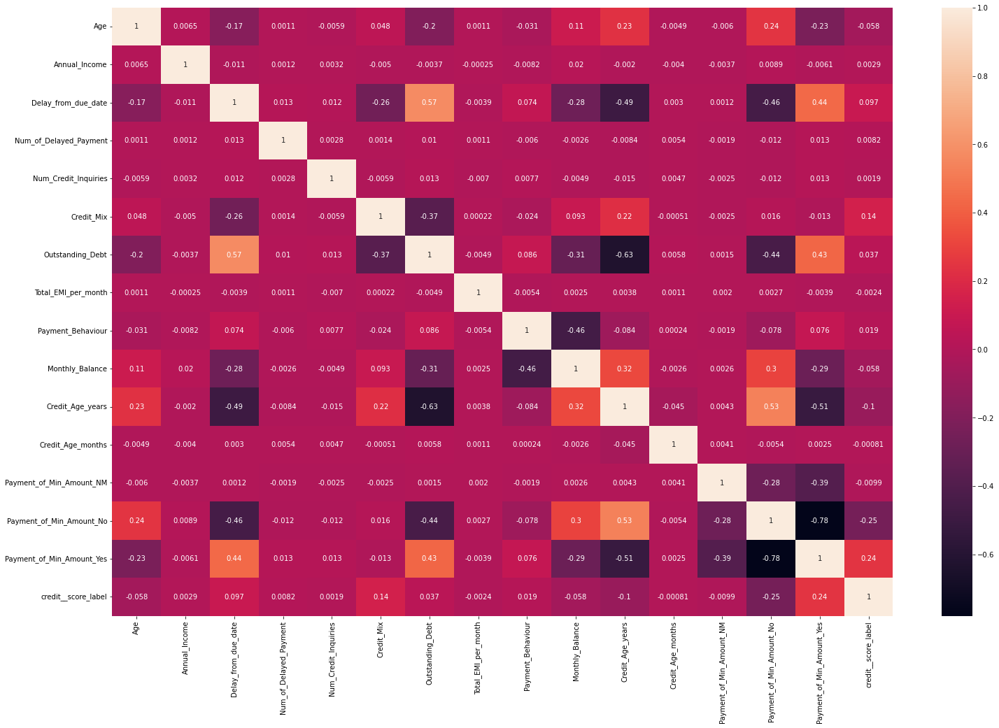

In [85]:
plt.figure(figsize=(25,16))
sns.heatmap(combined_df.corr(),annot=True)

In [86]:
correlation_values = abs(combined_df.corr()["credit__score_label"]).sort_values()
print("Sorted Correlation Values:")
print(correlation_values)

Sorted Correlation Values:
Credit_Age_months            0.000808
Num_Credit_Inquiries         0.001929
Total_EMI_per_month          0.002369
Annual_Income                0.002906
Num_of_Delayed_Payment       0.008163
Payment_of_Min_Amount_NM     0.009854
Payment_Behaviour            0.018793
Outstanding_Debt             0.037153
Monthly_Balance              0.058271
Age                          0.058464
Delay_from_due_date          0.097419
Credit_Age_years             0.102157
Credit_Mix                   0.144913
Payment_of_Min_Amount_Yes    0.243400
Payment_of_Min_Amount_No     0.247100
credit__score_label          1.000000
Name: credit__score_label, dtype: float64


In [87]:
combined_df.isnull().sum()

Age                          2781
Occupation                      0
Annual_Income                   0
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Total_EMI_per_month             0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Age_years             9030
Credit_Age_months            9030
Payment_of_Min_Amount_NM        0
Payment_of_Min_Amount_No        0
Payment_of_Min_Amount_Yes       0
credit__score_label             0
dtype: int64

KNN imputation is a technique for filling in missing values by estimating them based on the characteristics of similar neighboring data points. It's considered multivariate because it considers multiple variables or features in the dataset to estimate the missing values.

In [88]:
chunk_size = 5000  # Adjust the chunk size
numerical_data = combined_df.select_dtypes(include=['float64', 'int64']).columns
imputer = KNNImputer(n_neighbors=5)

for chunk_start in range(0, len(combined_df), chunk_size):
    chunk_end = min(chunk_start + chunk_size, len(combined_df))
    chunk_df = combined_df.loc[chunk_start:chunk_end-1, numerical_data]

    chunk_df[numerical_data] = imputer.fit_transform(chunk_df[numerical_data])

    combined_df.loc[chunk_start:chunk_end-1, numerical_data] = chunk_df[numerical_data]


In [89]:
combined_df.isnull().sum()

Age                          0
Occupation                   0
Annual_Income                0
Delay_from_due_date          0
Num_of_Delayed_Payment       0
Num_Credit_Inquiries         0
Credit_Mix                   0
Outstanding_Debt             0
Total_EMI_per_month          0
Payment_Behaviour            0
Monthly_Balance              0
Credit_Age_years             0
Credit_Age_months            0
Payment_of_Min_Amount_NM     0
Payment_of_Min_Amount_No     0
Payment_of_Min_Amount_Yes    0
credit__score_label          0
dtype: int64

In [90]:
table={}
for col in combined_df.columns:
    contingency_table = pd.crosstab(combined_df[col],combined_df['credit__score_label'])
    # Apply the chi-square test
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
    print(f"Chi-square test results for {col}:")
    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p}")
    print(f"Degrees of freedom: {dof}\n")
    table[col]={"Chi-square":chi2,"P":p}

Chi-square test results for Age:
Chi-square statistic: 5208.318384503913
P-value: 0.0
Degrees of freedom: 420

Chi-square test results for Occupation:
Chi-square statistic: 181.1000250439237
P-value: 2.4338587925736514e-24
Degrees of freedom: 28

Chi-square test results for Annual_Income:
Chi-square statistic: 134413.15470134554
P-value: 0.0
Degrees of freedom: 26972

Chi-square test results for Delay_from_due_date:
Chi-square statistic: 24626.21630538984
P-value: 0.0
Degrees of freedom: 134

Chi-square test results for Num_of_Delayed_Payment:
Chi-square statistic: 20620.623273002166
P-value: 0.0
Degrees of freedom: 2088

Chi-square test results for Num_Credit_Inquiries:
Chi-square statistic: 24725.851182154736
P-value: 0.0
Degrees of freedom: 2820

Chi-square test results for Credit_Mix:
Chi-square statistic: 32349.29941440455
P-value: 0.0
Degrees of freedom: 6

Chi-square test results for Outstanding_Debt:
Chi-square statistic: 131136.80570514553
P-value: 0.0
Degrees of freedom: 2440

In [91]:
for col, values in table.items():
    if values['P']>0.05:
        print(f"{col}:\nChi-square: {values['Chi-square']}      P-value: {values['P']:<20}\n")

Monthly_Balance:
Chi-square: 179753.8132882256      P-value: 0.08439107433520428 

Credit_Age_months:
Chi-square: 92.28120638548221      P-value: 0.4136256577084538  



since p value is >0.05 significance level we are dropping these columns

In [92]:
combined_df.drop(["Monthly_Balance","Credit_Age_months","Occupation"],axis=1,inplace=True)

In [93]:
combined_df.to_csv("Comb.csv",index=True)

In [94]:
x= combined_df.drop("credit__score_label",axis=1)
y=combined_df['credit__score_label']

In [95]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Age                        100000 non-null  float64
 1   Annual_Income              100000 non-null  float64
 2   Delay_from_due_date        100000 non-null  int64  
 3   Num_of_Delayed_Payment     100000 non-null  float64
 4   Num_Credit_Inquiries       100000 non-null  float64
 5   Credit_Mix                 100000 non-null  int32  
 6   Outstanding_Debt           100000 non-null  float64
 7   Total_EMI_per_month        100000 non-null  float64
 8   Payment_Behaviour          100000 non-null  int64  
 9   Credit_Age_years           100000 non-null  float64
 10  Payment_of_Min_Amount_NM   100000 non-null  float64
 11  Payment_of_Min_Amount_No   100000 non-null  float64
 12  Payment_of_Min_Amount_Yes  100000 non-null  float64
dtypes: float64(10), int32(1), int6

In [96]:
x.describe()

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
count,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,33.311736,1.764157e+05,21.081910,30.900646,27.721794,1.578800,1426.220376,1403.118216,3.001040,17.964508,0.120070,0.356670,0.523260
std,10.751098,1.429618e+06,14.840204,219.633624,191.625960,1.013647,1155.129026,8306.041270,1.973083,8.288767,0.325045,0.479019,0.499461
min,14.000000,7.005930e+03,0.000000,-3.000000,0.000000,0.000000,0.230000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.000000,1.945750e+04,10.000000,9.000000,3.000000,1.000000,566.072500,30.307000,1.000000,12.000000,0.000000,0.000000,0.000000
50%,33.000000,3.757861e+04,18.000000,14.000000,6.000000,2.000000,1166.155000,69.249500,3.000000,18.000000,0.000000,0.000000,1.000000
75%,42.000000,7.279092e+04,28.000000,18.000000,9.000000,2.000000,1945.962500,161.224000,5.000000,25.000000,0.000000,1.000000,1.000000
max,56.000000,2.419806e+07,67.000000,4397.000000,2597.000000,3.000000,4998.070000,82331.000000,6.000000,33.000000,1.000000,1.000000,1.000000


In [97]:
toscale=["Age","Annual_Income","Delay_from_due_date","Num_of_Delayed_Payment","Num_Credit_Inquiries","Credit_Mix","Outstanding_Debt","Total_EMI_per_month" ,"Payment_Behaviour"	,"Credit_Age_years"]

In [98]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), toscale)
    ],
    remainder='passthrough' 
)

# Create a pipeline with the preprocessor
pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

# Fit and transform the data
xs = pipeline.fit_transform(x)
joblib.dump(pipeline, 'pipeline.pkl')

['pipeline.pkl']

In [99]:
x = pd.DataFrame(xs, columns=x.columns)

In [100]:
x.describe()

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
count,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,100000.000000,100000.000000,100000.000000
mean,2.000156e-16,3.276796e-17,-1.550976e-16,3.349183e-16,2.071290e-15,1.201914e-15,-2.233769e-17,5.395517e-17,-1.100053e-16,-2.738032e-16,0.120070,0.356670,0.523260
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.325045,0.479019,0.499461
min,-1.796266e+00,-1.185006e-01,-1.420601e+00,-1.543517e-01,-1.446669e-01,-1.557552e+00,-1.234492e+00,-1.689283e-01,-1.520998e+00,-2.167342e+00,0.000000,0.000000,0.000000
25%,-8.661238e-01,-1.097909e-01,-7.467529e-01,-9.971495e-02,-1.290113e-01,-5.710102e-01,-7.446373e-01,-1.652795e-01,-1.014174e+00,-7.195929e-01,0.000000,0.000000,0.000000
50%,-2.899588e-02,-9.711530e-02,-2.076741e-01,-7.694965e-02,-1.133557e-01,4.155312e-01,-2.251408e-01,-1.605910e-01,-5.270964e-04,4.281961e-03,0.000000,0.000000,1.000000
75%,8.081321e-01,-7.248460e-02,4.661745e-01,-5.873741e-02,-9.770016e-02,4.155312e-01,4.499452e-01,-1.495177e-01,1.013120e+00,8.488026e-01,0.000000,1.000000,1.000000
max,2.110331e+00,1.680293e+01,3.094184e+00,1.987911e+01,1.340784e+01,1.402073e+00,3.092181e+00,9.743304e+00,1.519943e+00,1.813969e+00,1.000000,1.000000,1.000000


In [100]:
y

0        0
1        0
2        0
3        0
4        0
        ..
99995    1
99996    1
99997    1
99998    2
99999    1
Name: credit__score_label, Length: 100000, dtype: int32

Balanced Data

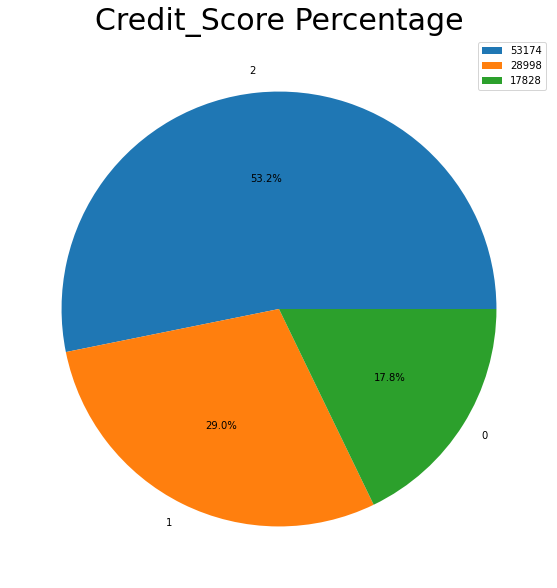

In [101]:
labels = combined_df["credit__score_label"].value_counts().index
sizes = combined_df["credit__score_label"].value_counts()

plt.figure(figsize = (10,10))
plt.pie(sizes, labels=labels, autopct='%1.1f%%')
plt.title('Customer Value Percentage',color = 'black',fontsize = 30)
plt.legend(combined_df["credit__score_label"].value_counts())
plt.show()

In [102]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Age                        100000 non-null  float64
 1   Annual_Income              100000 non-null  float64
 2   Delay_from_due_date        100000 non-null  int64  
 3   Num_of_Delayed_Payment     100000 non-null  float64
 4   Num_Credit_Inquiries       100000 non-null  float64
 5   Credit_Mix                 100000 non-null  int32  
 6   Outstanding_Debt           100000 non-null  float64
 7   Total_EMI_per_month        100000 non-null  float64
 8   Payment_Behaviour          100000 non-null  int64  
 9   Credit_Age_years           100000 non-null  float64
 10  Payment_of_Min_Amount_NM   100000 non-null  float64
 11  Payment_of_Min_Amount_No   100000 non-null  float64
 12  Payment_of_Min_Amount_Yes  100000 non-null  float64
 13  credit__score_label        100

In [103]:
x_train , x_test , y_train , y_test =train_test_split(x,y,test_size=0.2,random_state=0)

In [104]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(k_neighbors=7)
x_train_sm,y_train_sm=sm.fit_resample(x_train,y_train)

In [105]:
data_after_smote = pd.DataFrame(x_train_sm, columns=x_train.columns)
data_after_smote['target'] = y_train_sm 
data_after_smote['target']

0         1
1         1
2         1
3         0
4         1
         ..
127762    1
127763    1
127764    1
127765    1
127766    1
Name: target, Length: 127767, dtype: int32

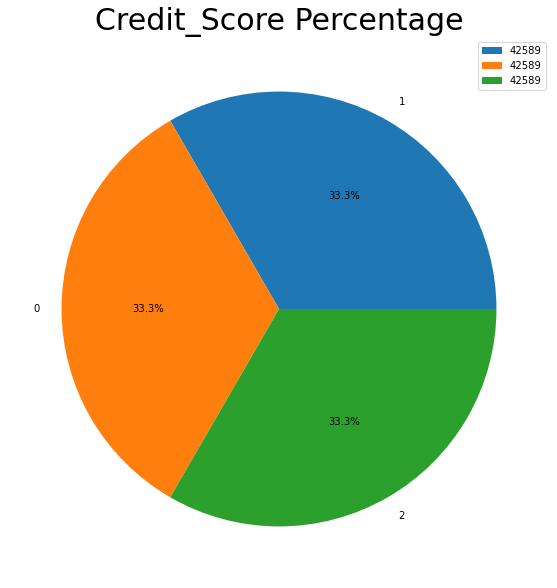

In [106]:
labels = data_after_smote['target'].value_counts().index
sizes = data_after_smote['target'].value_counts()

plt.figure(figsize = (10,10))
plt.pie(sizes, labels=labels, autopct='%1.1f%%')
plt.title('Customer Value Percentage',color = 'black',fontsize = 30)
plt.legend(data_after_smote['target'].value_counts())
plt.show()

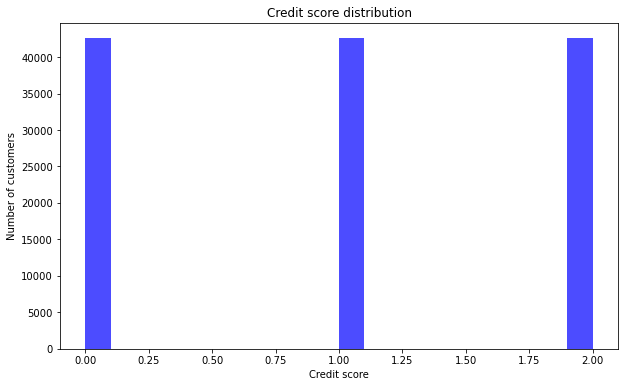

In [107]:
plt.figure(figsize=(10, 6))
plt.hist(data_after_smote['target'], bins=20, color='blue', alpha=0.7)
plt.title('Customer Value distribution')
plt.xlabel('Credit score')
plt.ylabel('Number of customers')
plt.show()

In [108]:
X= data_after_smote.drop(['target'],axis=1)
Y=data_after_smote['target']

In [109]:

x_train , x_test , y_train , y_test =train_test_split(X,Y,test_size=0.2,random_state=0)

In [110]:
x_train

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
98391,-0.334920,-0.088610,-0.814138,-0.098399,-0.135391,-0.571010,0.036705,-0.161486,-0.507351,0.934581,0.0,1.0,0.0
101881,1.559742,-0.043588,-1.207586,-0.131219,-0.138187,-0.571010,-0.101714,-0.111223,1.013120,1.220463,0.0,1.0,0.0
14143,-0.773110,-0.109976,1.948641,-0.063290,-0.113356,-1.557552,2.408011,6.428471,-0.507351,-0.840239,0.0,0.0,1.0
33653,1.608054,-0.107709,-0.746753,-0.049631,1.410454,1.402073,-1.222814,-0.166877,1.013120,1.693323,0.0,0.0,1.0
68110,0.436075,-0.031560,-1.420601,-0.140692,-0.134230,-0.571010,-0.343574,8.683107,-0.000527,1.090094,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45891,-0.270833,-0.103120,-0.814138,-0.140692,-0.144667,-0.571010,-0.522455,-0.166720,1.013120,0.197315,0.0,1.0,0.0
117952,-1.477703,-0.100067,1.572963,-0.056803,-0.091698,-1.557552,1.761662,-0.151487,1.013120,-0.622454,0.0,0.0,1.0
42613,-0.401053,-0.038840,0.264020,-0.136139,-0.129011,-0.571010,-0.191530,-0.168928,-1.014174,0.245574,0.0,1.0,0.0
43567,-1.517223,-0.079826,0.668329,-0.054184,-0.102919,-1.557552,1.282045,0.213566,1.013120,-0.960884,0.0,0.0,1.0


In [111]:
x_test

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
59532,1.831288,-0.059072,-1.151062,-0.140692,-0.118574,-0.571010,-1.071756,-0.143530,-0.507351,0.969448,0.0,1.0,0.0
9551,-0.494067,-0.038043,0.466175,-0.090609,-0.123793,1.402073,-1.188774,-0.133951,-1.014174,0.848803,0.0,1.0,0.0
25164,0.566295,-0.079402,-0.881523,-0.067844,-0.113356,0.415531,-1.037093,-0.159099,-0.000527,-0.767851,0.0,0.0,1.0
110937,-0.775193,-0.108265,0.160679,-0.099715,-0.131562,-0.571010,-0.244618,-0.167802,0.883577,1.149066,1.0,0.0,0.0
84856,0.279269,-0.075763,0.142672,-0.097761,-0.129011,-0.571010,-1.172871,-0.168928,0.853891,1.776066,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69126,-0.680095,-0.103572,-0.477213,-0.108821,-0.144667,-0.571010,-0.587384,-0.168928,1.013120,1.090094,1.0,0.0,0.0
43669,-0.028996,-0.102128,-0.544598,-0.136139,-0.134230,-0.571010,-0.793353,-0.166104,1.013120,0.124928,0.0,1.0,0.0
55501,1.180189,-0.079474,2.083411,-0.045078,-0.108137,-1.557552,2.353636,-0.136258,1.519943,-1.926051,0.0,0.0,1.0
25822,-0.122010,-0.101970,-0.477213,-0.081503,-0.139448,0.415531,0.039814,-0.159943,1.519943,-0.237010,0.0,0.0,1.0


In [112]:
def logistic():
    from sklearn.linear_model import LogisticRegressionCV
    model = LogisticRegressionCV()
    model.fit(x_train, y_train)
    return model


def knn():
    from sklearn.neighbors import KNeighborsClassifier
    model = KNeighborsClassifier(n_neighbors=7)
    model.fit(x_train, y_train)
    return model


#def naive_bayes():
#    from sklearn.naive_bayes import GaussianNB
#    model = GaussianNB()
#    model.fit(x_train, y_train)
#    return model


def decisionTree():
    from sklearn.tree import DecisionTreeClassifier
    model = DecisionTreeClassifier(max_depth=500)
    model.fit(x_train, y_train)
    return model


def randomForest():
    from sklearn.ensemble import RandomForestClassifier
    model = RandomForestClassifier(n_estimators=500)
    model.fit(x_train, y_train)
    
    return model

#def svm():
#    from sklearn.svm import SVC
#    model = SVC(C=2, kernel='rbf')
#    model.fit(x_train, y_train)
#    return model

def catboost():
    from catboost import CatBoostClassifier
    model = CatBoostClassifier(verbose=False)
    model.fit(x_train, y_train)
    return model


def xgboost():
    from xgboost import XGBClassifier
    model = XGBClassifier()
    model.fit(x_train, y_train)
    return model

# Model Evaluation

In [113]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

def evaluate_model_test(model):
    y_true = y_test
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred,average="macro")
    recall = recall_score(y_true, y_pred,average="macro")
    f1 = f1_score(y_true, y_pred,average="macro")

    return accuracy, precision, recall, f1

# Evaluation Report

In [114]:
model_functions = [
    {"name": "Logistic Regression", "function": logistic},
    {"name": "K Nearest Neighbour", "function": knn},
    #{"name": "Naive Bayes", "function": naive_bayes},
    {"name": "Decision Tree", "function": decisionTree},
    {"name": "Random Forest", "function": randomForest},
    #{"name": "SVM", "function": svm},
    {"name": "CatBoost", "function": catboost},
    {"name": "XGBoost", "function": xgboost}
]

In [115]:
model_evaluation_report = []

In [116]:
for model_info in model_functions:
    model = model_info["function"]()
    # metrics_train = evaluate_model_train(model)
    metrics_test = evaluate_model_test(model)
    model_evaluation_report.append({
        "name": model_info["name"],
        # "train_accuracy": metrics_train[0],
        # "train_precision": metrics_train[1],
        # "train_recall": metrics_train[2],
        # "train_f1": metrics_train[3],
        "accuracy": metrics_test[0],
        "precision": metrics_test[1],
        "recall": metrics_test[2],
        "f1": metrics_test[3]

    })

In [117]:
df_result = pd.DataFrame(model_evaluation_report)
df_result

,name,accuracy,precision,recall,f1
0,Logistic Regression,0.638413,0.636032,0.637841,0.628946
1,K Nearest Neighbour,0.734366,0.736058,0.734002,0.724623
2,Decision Tree,0.754911,0.754985,0.754805,0.754871
3,Random Forest,0.832394,0.831877,0.832194,0.830737
4,CatBoost,0.787157,0.788030,0.786884,0.784657
5,XGBoost,0.790835,0.791640,0.790575,0.788346


In [118]:
import pickle

# Assuming that the Random Forest model is the fifth model in your list
random_forest_model = model_functions[4]["function"]()

# Fit the model on the entire dataset before saving (optional but recommended)
random_forest_model.fit(x_train, y_train)

# Save the trained model to a file using pickle
with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(random_forest_model, file)

In [119]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation,Dropout
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [120]:
import numpy as np
from sklearn.metrics import classification_report
num_classes = y_train.nunique()

model = Sequential()
model.add(Dense(units=30, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=15, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=num_classes, activation='softmax'))  # Use softmax for multiclass classification
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# Assuming you have defined "early_stop" somewhere in your code
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=25)

model.fit(
    x=x_train,
    y=y_train,  # Convert y_train to categorical if it's not
    epochs=10,
    validation_data=(x_test, y_test),  # Convert y_test to categorical if it's not
    verbose=1,
    callbacks=[early_stop]  # Use the actual EarlyStopping callback instance
)



Epoch 1/10

3195/3195 [==============================] - 6s 2ms/step - loss: 0.9358 - val_loss: 0.8287
Epoch 2/10
3195/3195 [==============================] - 5s 2ms/step - loss: 0.8682 - val_loss: 0.8044
Epoch 3/10
3195/3195 [==============================] - 5s 2ms/step - loss: 0.8471 - val_loss: 0.7859
Epoch 4/10
3195/3195 [==============================] - 5s 2ms/step - loss: 0.8370 - val_loss: 0.7783
Epoch 5/10
3195/3195 [==============================] - 7s 2ms/step - loss: 0.8311 - val_loss: 0.7767
Epoch 6/10
3195/3195 [==============================] - 6s 2ms/step - loss: 0.8274 - val_loss: 0.7722
Epoch 7/10
3195/3195 [==============================] - 6s 2ms/step - loss: 0.8255 - val_loss: 0.7753
Epoch 8/10
3195/3195 [==============================] - 6s 2ms/step - loss: 0.8251 - val_loss: 0.7722
Epoch 9/10
3195/3195 [==============================] - 6s 2ms/step - loss: 0.8246 - val_loss: 0.7715
Epoch 10/10
3195/3195 [==============================] - 6s 2ms/step - loss: 0.

In [121]:
# Predictions for multiclass classification
#predictions = model.predict(x_test)
#predicted_classes = np.argmax(predictions, axis=1)

# Use y_test directly if it's not one-hot encoded
#print(classification_report(y_test, predicted_classes))

In [122]:
predicted_classes_list = []

for i in range(len(x_test)):
    # Extract a single example from x_test
    single_example = x_test.iloc[[i]]

    # Predict for the single example
    single_prediction = model.predict(single_example)
    predicted_class = np.argmax(single_prediction, axis=1)[0]

    # Append the predicted class to the list
    predicted_classes_list.append(predicted_class)

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


In [123]:
predicted_classes_list

[0,
 2,
 2,
 0,
 0,
 0,
 1,
 1,
 0,
 2,
 0,
 0,
 1,
 1,
 1,
 0,
 2,
 0,
 1,
 0,
 2,
 0,
 0,
 1,
 0,
 1,
 2,
 1,
 2,
 2,
 0,
 1,
 0,
 0,
 0,
 2,
 1,
 1,
 1,
 0,
 0,
 2,
 2,
 1,
 0,
 2,
 1,
 2,
 0,
 1,
 1,
 2,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 2,
 2,
 0,
 0,
 0,
 2,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 2,
 1,
 1,
 1,
 2,
 1,
 2,
 0,
 1,
 2,
 0,
 0,
 1,
 2,
 2,
 1,
 0,
 0,
 1,
 0,
 2,
 1,
 2,
 0,
 0,
 1,
 1,
 0,
 0,
 2,
 0,
 0,
 1,
 2,
 1,
 1,
 0,
 2,
 2,
 0,
 0,
 0,
 2,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 2,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 2,
 1,
 0,
 0,
 0,
 1,
 1,
 2,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 2,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 2,
 2,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 2,
 2,
 2,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 2,
 0,
 0,
 0,
 0,
 2,
 1,
 2,
 0,
 0,
 2,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 2,
 0,
 1,
 0,
 0,
 1,
 0,
 2,
 2,
 0,
 0,
 1,
 0,
 0,
 2,
 1,
 0,
 1,
 0,
 1,
 2,
 2,


In [124]:
df_predicted_classes = pd.DataFrame({'Predicted_Classes': predicted_classes_list})
df_predicted_classes

,Predicted_Classes
0,0
1,2
2,2
3,0
4,0
...,...
25549,0
25550,0
25551,1
25552,1


In [125]:
print(classification_report(y_test, df_predicted_classes))

              precision    recall  f1-score   support

           0       0.66      0.83      0.74      8575
           1       0.70      0.77      0.74      8476
           2       0.69      0.44      0.54      8503

    accuracy                           0.68     25554
   macro avg       0.69      0.68      0.67     25554
weighted avg       0.69      0.68      0.67     25554



In [126]:
class_to_customer_value = {0: 'High Value Customer', 1: 'Low Value Customer', 2: 'Mid Value Customer'}
df_predicted_classes['Customer_Value'] = df_predicted_classes['Predicted_Classes'].map(class_to_customer_value)

In [597]:
df_predicted_classes

,Predicted_Classes,Customer_Value
0,0,High Value Customer
1,2,Mid Value Customer
2,2,Mid Value Customer
3,0,High Value Customer
4,0,High Value Customer
...,...,...
25549,0,High Value Customer
25550,0,High Value Customer
25551,1,Low Value Customer
25552,1,Low Value Customer


In [598]:
df_predicted_classes.to_csv("Cust.csv", index=True)

In [101]:
a = pd.read_csv("Cust.csv")

In [102]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Fit and transform the 'Customer_Value' column
a['Customer_Value_Encoded'] = label_encoder.fit_transform(a['Customer_Value'])


In [103]:
a

,Unnamed: 0,Predicted_Classes,Customer_Value,Customer_Value_Encoded
0,0,0,High Value Customer,0
1,1,2,Mid Value Customer,2
2,2,2,Mid Value Customer,2
3,3,0,High Value Customer,0
4,4,0,High Value Customer,0
...,...,...,...,...
25549,25549,0,High Value Customer,0
25550,25550,0,High Value Customer,0
25551,25551,1,Low Value Customer,1
25552,25552,1,Low Value Customer,1


In [104]:
a.to_csv("a.csv",index=True)

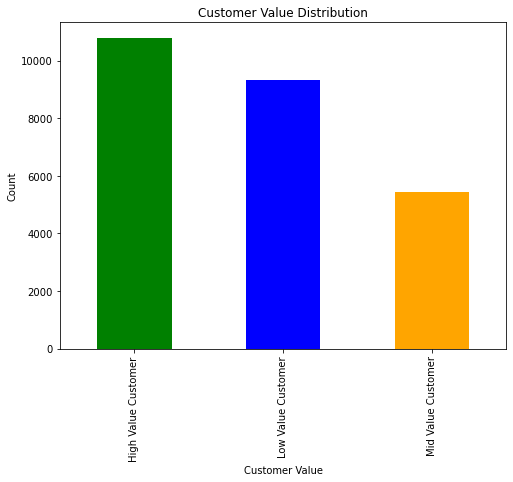

In [127]:
plt.figure(figsize=(8, 6))
df_predicted_classes['Customer_Value'].value_counts().sort_index().plot(kind='bar', color=['green', 'blue', 'orange'])
plt.title('Customer Value Distribution')
plt.xlabel('Customer Value')
plt.ylabel('Count')
plt.show()

In [596]:
import plotly.express as px

fig = px.pie(df_predicted_classes['Customer_Value'].value_counts().reset_index(), 
             names='index', 
             values='Customer_Value', 
             title='Customer Value Distribution')
fig.show()


# Credit Card

In [2]:
customer_df = pd.read_csv("Customer_Data.csv")
credit_df = pd.read_csv("Credit _Data.csv")

C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\698648969.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  customer_df = pd.read_csv("Customer_Data.csv")


In [3]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ID                       100000 non-null  object 
 1   Customer_ID              100000 non-null  object 
 2   Month                    100000 non-null  object 
 3   Name                     90015 non-null   object 
 4   Age                      100000 non-null  object 
 5   SSN                      100000 non-null  object 
 6   Occupation               100000 non-null  object 
 7   Annual_Income            100000 non-null  object 
 8   Monthly_Inhand_Salary    84998 non-null   float64
 9   Num_Bank_Accounts        100000 non-null  int64  
 10  Interest_Rate            100000 non-null  int64  
 11  Num_of_Loan              100000 non-null  object 
 12  Type_of_Loan             88592 non-null   object 
 13  Delay_from_due_date      100000 non-null  int64  
 14  Num_o

In [4]:
customer_df.shape

(100000, 25)

In [5]:
customer_df.dtypes

ID                          object
Customer_ID                 object
Month                       object
Name                        object
Age                         object
SSN                         object
Occupation                  object
Annual_Income               object
Monthly_Inhand_Salary      float64
Num_Bank_Accounts            int64
Interest_Rate                int64
Num_of_Loan                 object
Type_of_Loan                object
Delay_from_due_date          int64
Num_of_Delayed_Payment      object
Num_Credit_Inquiries       float64
Credit_Mix                  object
Outstanding_Debt            object
Credit_History_Age          object
Payment_of_Min_Amount       object
Total_EMI_per_month        float64
Amount_invested_monthly     object
Payment_Behaviour           object
Monthly_Balance             object
Credit_Score                object
dtype: object

In [6]:
customer_df.isnull().sum()/len(customer_df)*100

ID                          0.000
Customer_ID                 0.000
Month                       0.000
Name                        9.985
Age                         0.000
SSN                         0.000
Occupation                  0.000
Annual_Income               0.000
Monthly_Inhand_Salary      15.002
Num_Bank_Accounts           0.000
Interest_Rate               0.000
Num_of_Loan                 0.000
Type_of_Loan               11.408
Delay_from_due_date         0.000
Num_of_Delayed_Payment      7.002
Num_Credit_Inquiries        1.965
Credit_Mix                  0.000
Outstanding_Debt            0.000
Credit_History_Age          9.030
Payment_of_Min_Amount       0.000
Total_EMI_per_month         0.000
Amount_invested_monthly     4.479
Payment_Behaviour           0.000
Monthly_Balance             1.200
Credit_Score                0.000
dtype: float64

In [7]:
new_customer = customer_df.dropna()
new_customer

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28_,004-07-5839,_______,34847.84,3037.986667,2,...,2.0,Good,605.03,26 Years and 7 Months,No,18.816215,104.2918252,Low_spent_Small_value_payments,470.69062692529184,Standard
9,0x160f,CUS_0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,2.0,Good,605.03,26 Years and 8 Months,No,18.816215,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good
10,0x1610,CUS_0x21b1,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.84_,3037.986667,2,...,2.0,_,605.03,26 Years and 9 Months,No,18.816215,58.51597569589465,High_spent_Large_value_payments,466.46647639764313,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,0x25fe8,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 5 Months,No,35.104023,140.58140274528395,High_spent_Medium_value_payments,410.256158,Poor
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,_,502.38,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor


In [8]:
new_customer.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53049 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       53049 non-null  object 
 1   Customer_ID              53049 non-null  object 
 2   Month                    53049 non-null  object 
 3   Name                     53049 non-null  object 
 4   Age                      53049 non-null  object 
 5   SSN                      53049 non-null  object 
 6   Occupation               53049 non-null  object 
 7   Annual_Income            53049 non-null  object 
 8   Monthly_Inhand_Salary    53049 non-null  float64
 9   Num_Bank_Accounts        53049 non-null  int64  
 10  Interest_Rate            53049 non-null  int64  
 11  Num_of_Loan              53049 non-null  object 
 12  Type_of_Loan             53049 non-null  object 
 13  Delay_from_due_date      53049 non-null  int64  
 14  Num_of_Delayed_Payment   53

In [9]:
data_lost=(len(customer_df)-len(new_customer))*100/len(customer_df)
f"Data Lost-{data_lost:0.2f} %"

'Data Lost-46.95 %'

In [10]:
customer_df.drop("Name",axis=1,inplace=True)

In [11]:
customer_df.head()

,ID,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Interest_Rate,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,23,821-00-0265,Scientist,19114.12,1824.843333,3,3,...,4.0,_,809.98,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,23,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,-500,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,23,821-00-0265,Scientist,19114.12,NaN,3,3,...,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,23,821-00-0265,Scientist,19114.12,1824.843333,3,3,...,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [12]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ID                       100000 non-null  object 
 1   Customer_ID              100000 non-null  object 
 2   Month                    100000 non-null  object 
 3   Age                      100000 non-null  object 
 4   SSN                      100000 non-null  object 
 5   Occupation               100000 non-null  object 
 6   Annual_Income            100000 non-null  object 
 7   Monthly_Inhand_Salary    84998 non-null   float64
 8   Num_Bank_Accounts        100000 non-null  int64  
 9   Interest_Rate            100000 non-null  int64  
 10  Num_of_Loan              100000 non-null  object 
 11  Type_of_Loan             88592 non-null   object 
 12  Delay_from_due_date      100000 non-null  int64  
 13  Num_of_Delayed_Payment   92998 non-null   object 
 14  Num_C

In [13]:
customer_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


In [14]:
customer_df.columns

Index(['ID', 'Customer_ID', 'Month', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Credit_Score'],
      dtype='object')

In [15]:
drop_customer = customer_df.drop(['ID','Month','SSN','Num_Bank_Accounts',
         'Interest_Rate','Num_of_Loan','Type_of_Loan','Amount_invested_monthly','Credit_Score'], axis=1).copy()
drop_customer

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance
0,CUS_0xd40,23,Scientist,19114.12,1824.843333,3,7,4.0,_,809.98,22 Years and 1 Months,No,49.574949,High_spent_Small_value_payments,312.49408867943663
1,CUS_0xd40,23,Scientist,19114.12,NaN,-1,NaN,4.0,Good,809.98,NaN,No,49.574949,Low_spent_Large_value_payments,284.62916249607184
2,CUS_0xd40,-500,Scientist,19114.12,NaN,3,7,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,Low_spent_Medium_value_payments,331.2098628537912
3,CUS_0xd40,23,Scientist,19114.12,NaN,5,4,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,Low_spent_Small_value_payments,223.45130972736786
4,CUS_0xd40,23,Scientist,19114.12,1824.843333,6,NaN,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,High_spent_Medium_value_payments,341.48923103222177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25,Mechanic,39628.99,3359.415833,23,7,3.0,_,502.38,31 Years and 6 Months,No,35.104023,High_spent_Large_value_payments,479.866228
99996,CUS_0x942c,25,Mechanic,39628.99,3359.415833,18,7,3.0,_,502.38,31 Years and 7 Months,No,35.104023,High_spent_Medium_value_payments,496.65161
99997,CUS_0x942c,25,Mechanic,39628.99,3359.415833,27,6,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,High_spent_Large_value_payments,516.809083
99998,CUS_0x942c,25,Mechanic,39628.99,3359.415833,20,NaN,3.0,Good,502.38,31 Years and 9 Months,No,35.104023,Low_spent_Large_value_payments,319.164979


# ------------------AGE------------------------

In [16]:
drop_customer["Age"]

0          23
1          23
2        -500
3          23
4          23
         ... 
99995      25
99996      25
99997      25
99998      25
99999      25
Name: Age, Length: 100000, dtype: object

In [17]:
def filter_col(value):
    if '-' in value:
        return value.split('-')[1]
    elif '_' in value:
        return value.split('_')[0]
    else:
        return value

In [18]:
type(customer_df["Age"])

pandas.core.series.Series

In [19]:
drop_customer["Age"] = drop_customer["Age"].apply(filter_col)
drop_customer["Age"] = drop_customer["Age"].astype(int)

In [20]:
for i in range(len(drop_customer["Age"])):
    if drop_customer["Age"][i] > 90 or drop_customer["Age"][i] < 10:
        drop_customer["Age"][i] = np.nan
    else:
        drop_customer["Age"][i] = drop_customer["Age"][i]

C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\2469613.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_customer["Age"][i] = drop_customer["Age"][i]
C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\2469613.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_customer["Age"][i] = drop_customer["Age"][i]
C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\2469613.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_cust

In [21]:
drop_customer["Age"]

0        23.0
1        23.0
2         NaN
3        23.0
4        23.0
         ... 
99995    25.0
99996    25.0
99997    25.0
99998    25.0
99999    25.0
Name: Age, Length: 100000, dtype: float64

In [22]:
drop_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Customer_ID             100000 non-null  object 
 1   Age                     97219 non-null   float64
 2   Occupation              100000 non-null  object 
 3   Annual_Income           100000 non-null  object 
 4   Monthly_Inhand_Salary   84998 non-null   float64
 5   Delay_from_due_date     100000 non-null  int64  
 6   Num_of_Delayed_Payment  92998 non-null   object 
 7   Num_Credit_Inquiries    98035 non-null   float64
 8   Credit_Mix              100000 non-null  object 
 9   Outstanding_Debt        100000 non-null  object 
 10  Credit_History_Age      90970 non-null   object 
 11  Payment_of_Min_Amount   100000 non-null  object 
 12  Total_EMI_per_month     100000 non-null  float64
 13  Payment_Behaviour       100000 non-null  object 
 14  Monthly_Balance      

# ------------------OCCUPATION-------------------------

In [23]:
drop_customer["Occupation"].value_counts()

Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64

In [24]:
drop_customer["Occupation"].replace("_______",np.nan,inplace=True)

In [25]:
drop_customer["Occupation"]=drop_customer["Occupation"].astype("object")

In [26]:
drop_customer["Occupation"].value_counts()

Occupation
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64

In [27]:
drop_customer

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance
0,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,3,7,4.0,_,809.98,22 Years and 1 Months,No,49.574949,High_spent_Small_value_payments,312.49408867943663
1,CUS_0xd40,23.0,Scientist,19114.12,NaN,-1,NaN,4.0,Good,809.98,NaN,No,49.574949,Low_spent_Large_value_payments,284.62916249607184
2,CUS_0xd40,NaN,Scientist,19114.12,NaN,3,7,4.0,Good,809.98,22 Years and 3 Months,No,49.574949,Low_spent_Medium_value_payments,331.2098628537912
3,CUS_0xd40,23.0,Scientist,19114.12,NaN,5,4,4.0,Good,809.98,22 Years and 4 Months,No,49.574949,Low_spent_Small_value_payments,223.45130972736786
4,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,6,NaN,4.0,Good,809.98,22 Years and 5 Months,No,49.574949,High_spent_Medium_value_payments,341.48923103222177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,23,7,3.0,_,502.38,31 Years and 6 Months,No,35.104023,High_spent_Large_value_payments,479.866228
99996,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,18,7,3.0,_,502.38,31 Years and 7 Months,No,35.104023,High_spent_Medium_value_payments,496.65161
99997,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,27,6,3.0,Good,502.38,31 Years and 8 Months,No,35.104023,High_spent_Large_value_payments,516.809083
99998,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,20,NaN,3.0,Good,502.38,31 Years and 9 Months,No,35.104023,Low_spent_Large_value_payments,319.164979


In [28]:
abcd=['Age', 'Occupation', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries']

# -------------------------Delay_from_due_date--------------------------

In [29]:
drop_customer["Delay_from_due_date"].value_counts().sort_index()

Delay_from_due_date
-5      33
-4      62
-3     118
-2     168
-1     210
      ... 
 63     69
 64     64
 65     56
 66     32
 67     22
Name: count, Length: 73, dtype: int64

In [30]:
drop_customer["Delay_from_due_date"].isnull().sum()

0

In [31]:
drop_customer["Delay_from_due_date"] = drop_customer["Delay_from_due_date"].apply(lambda x: max(x, 0))

# ------------------Num_of_Delayed_Payment-----------------------

In [32]:
drop_customer["Num_of_Delayed_Payment"].isnull().sum()

7002

In [33]:
def filter_(value:str):
    if '_' in str(value):
        return value.split('_')[0]
    else:
        return value
drop_customer["Num_of_Delayed_Payment"]= drop_customer["Num_of_Delayed_Payment"].apply(filter_)

In [34]:
drop_customer["Num_of_Delayed_Payment"]= drop_customer["Num_of_Delayed_Payment"].astype("float64")

In [35]:
drop_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Customer_ID             100000 non-null  object 
 1   Age                     97219 non-null   float64
 2   Occupation              92938 non-null   object 
 3   Annual_Income           100000 non-null  object 
 4   Monthly_Inhand_Salary   84998 non-null   float64
 5   Delay_from_due_date     100000 non-null  int64  
 6   Num_of_Delayed_Payment  92998 non-null   float64
 7   Num_Credit_Inquiries    98035 non-null   float64
 8   Credit_Mix              100000 non-null  object 
 9   Outstanding_Debt        100000 non-null  object 
 10  Credit_History_Age      90970 non-null   object 
 11  Payment_of_Min_Amount   100000 non-null  object 
 12  Total_EMI_per_month     100000 non-null  float64
 13  Payment_Behaviour       100000 non-null  object 
 14  Monthly_Balance      

# ------------Num_Credit_Inquiries-----------------

In [36]:
drop_customer["Num_Credit_Inquiries"].isnull().sum()

1965

# -------------------Annual_Income------------------

In [37]:
drop_customer["Annual_Income"].value_counts()

Annual_Income
36585.12     16
20867.67     16
17273.83     16
9141.63      15
33029.66     15
             ..
20269.93_     1
15157.25_     1
44955.64_     1
76650.12_     1
4262933       1
Name: count, Length: 18940, dtype: int64

In [38]:
drop_customer["Annual_Income"] = drop_customer["Annual_Income"].apply(filter_col)
drop_customer["Annual_Income"] = drop_customer["Annual_Income"].astype(float)

In [39]:
drop_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Customer_ID             100000 non-null  object 
 1   Age                     97219 non-null   float64
 2   Occupation              92938 non-null   object 
 3   Annual_Income           100000 non-null  float64
 4   Monthly_Inhand_Salary   84998 non-null   float64
 5   Delay_from_due_date     100000 non-null  int64  
 6   Num_of_Delayed_Payment  92998 non-null   float64
 7   Num_Credit_Inquiries    98035 non-null   float64
 8   Credit_Mix              100000 non-null  object 
 9   Outstanding_Debt        100000 non-null  object 
 10  Credit_History_Age      90970 non-null   object 
 11  Payment_of_Min_Amount   100000 non-null  object 
 12  Total_EMI_per_month     100000 non-null  float64
 13  Payment_Behaviour       100000 non-null  object 
 14  Monthly_Balance      

In [40]:
abcd=[ 'Occupation', 
       'Num_of_Delayed_Payment',
        
        
       'Outstanding_Debt', 'Credit_History_Age',
      'Total_EMI_per_month', 

      
      'Payment_Behaviour', 'Monthly_Balance']

# -----------------Monthly_Balance-----------------

In [41]:
drop_customer["Monthly_Balance"].isnull().sum()

1200

In [42]:
drop_customer["Monthly_Balance"].value_counts()

Monthly_Balance
__-333333333333333333333333333__    9
312.49408867943663                  1
415.32532309844316                  1
252.08489793906085                  1
254.9709216273975                   1
                                   ..
366.2890379762706                   1
151.1882696261166                   1
306.75027851710234                  1
278.8720257394474                   1
393.6736955618808                   1
Name: count, Length: 98792, dtype: int64

In [43]:
drop_customer['Monthly_Balance']=drop_customer['Monthly_Balance'].replace('__-333333333333333333333333333__',np.nan)
drop_customer['Monthly_Balance']=drop_customer['Monthly_Balance'].astype("float")

In [44]:
drop_customer['Monthly_Balance']=drop_customer['Monthly_Balance'].fillna(drop_customer["Monthly_Balance"].mean())
drop_customer['Monthly_Balance']=drop_customer['Monthly_Balance'].round(3)

In [45]:
drop_customer["Monthly_Balance"].isnull().sum()

0

# ---------------Credit_History_Age------------------

In [46]:
years  = []
months = []
for value in drop_customer["Credit_History_Age"]:
    if value is np.nan:
        years.append(np.nan)
        months.append(np.nan)
    else:
        new_str = value.lower().split()
        years_ = int(new_str[0])
        months_ = int(new_str[new_str.index('and')+1])
        years.append(years_)
        months.append(months_)
drop_customer['Credit_Age_years'] = pd.Series(years)
drop_customer['Credit_Age_months'] = pd.Series(months) 
drop_customer.drop('Credit_History_Age',axis=1,inplace=True)

In [47]:
drop_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Customer_ID             100000 non-null  object 
 1   Age                     97219 non-null   float64
 2   Occupation              92938 non-null   object 
 3   Annual_Income           100000 non-null  float64
 4   Monthly_Inhand_Salary   84998 non-null   float64
 5   Delay_from_due_date     100000 non-null  int64  
 6   Num_of_Delayed_Payment  92998 non-null   float64
 7   Num_Credit_Inquiries    98035 non-null   float64
 8   Credit_Mix              100000 non-null  object 
 9   Outstanding_Debt        100000 non-null  object 
 10  Payment_of_Min_Amount   100000 non-null  object 
 11  Total_EMI_per_month     100000 non-null  float64
 12  Payment_Behaviour       100000 non-null  object 
 13  Monthly_Balance         100000 non-null  float64
 14  Credit_Age_years     

# -----------Credit_Mix------------------

In [48]:
drop_customer["Credit_Mix"].value_counts()

Credit_Mix
Standard    36479
Good        24337
_           20195
Bad         18989
Name: count, dtype: int64

In [49]:
drop_customer['Credit_Mix']=drop_customer['Credit_Mix'].replace('_',np.nan)

In [50]:
lc=LabelEncoder()
drop_customer["Credit_Mix"]=lc.fit_transform(drop_customer["Credit_Mix"])

In [51]:
drop_customer["Credit_Mix"].value_counts()

Credit_Mix
2    36479
1    24337
3    20195
0    18989
Name: count, dtype: int64

# --------------Payment_Behaviour----------------

In [52]:
drop_customer["Payment_Behaviour"].value_counts()

Payment_Behaviour
Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: count, dtype: int64

In [53]:
drop_customer["Payment_Behaviour"]=drop_customer["Payment_Behaviour"].replace("!@9#%8",np.nan)

In [54]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
drop_customer["Payment_Behaviour"]=l.fit_transform(drop_customer["Payment_Behaviour"])

In [55]:
drop_customer["Payment_Behaviour"].ffill(inplace=True)

In [56]:
drop_customer["Payment_Behaviour"]=drop_customer["Payment_Behaviour"].astype("int64")

In [57]:
drop_customer["Payment_Behaviour"].value_counts()

Payment_Behaviour
5    25513
1    17540
4    13861
0    13721
2    11340
3    10425
6     7600
Name: count, dtype: int64

# ---------------Outstanding_Debt------------------------

In [58]:
drop_customer["Outstanding_Debt"].isna().sum()

0

In [59]:
drop_customer["Outstanding_Debt"].value_counts()

Outstanding_Debt
1360.45     24
460.46      23
1151.7      23
1109.03     23
467.7       16
            ..
245.46_      1
645.77_      1
174.79_      1
1181.13_     1
1013.53_     1
Name: count, Length: 13178, dtype: int64

In [60]:
drop_customer["Outstanding_Debt"] = drop_customer["Outstanding_Debt"].apply(filter_col)
drop_customer["Outstanding_Debt"] = drop_customer["Outstanding_Debt"].astype(float)

In [61]:
drop_customer["Outstanding_Debt"].value_counts()

Outstanding_Debt
1109.03    24
1151.70    24
1360.45    24
460.46     24
1058.13    16
           ..
4230.04     8
641.99      8
98.61       8
2614.48     8
502.38      8
Name: count, Length: 12203, dtype: int64

# ------------------Num_Credit_Inquiries---------------------

In [62]:
drop_customer["Num_Credit_Inquiries"].value_counts()

Num_Credit_Inquiries
4.0       11271
3.0        8890
6.0        8111
7.0        8058
2.0        8028
          ...  
1721.0        1
1750.0        1
2397.0        1
621.0         1
74.0          1
Name: count, Length: 1223, dtype: int64

In [63]:
(drop_customer["Num_Credit_Inquiries"]<0).sum()

0

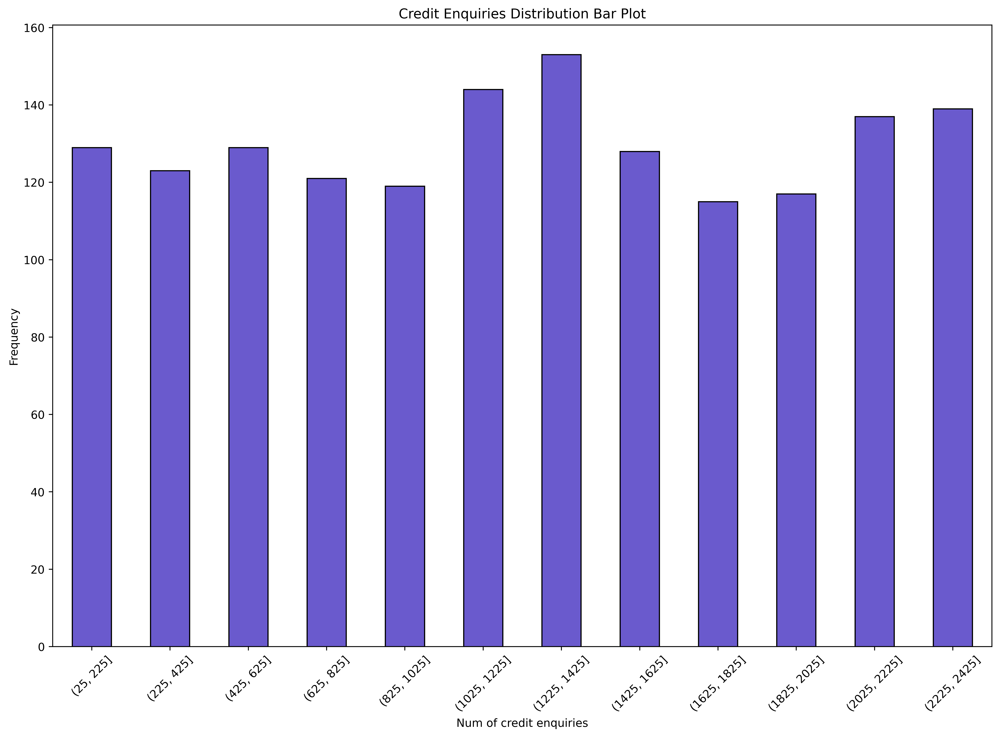

In [64]:
age_bins = range(25,2600,200)  # Define your age ranges
plt.figure(figsize=(15,10),dpi=500)

# Use pd.cut to categorize ages into bins and get the frequency count
delay_ranges = pd.cut(drop_customer["Num_Credit_Inquiries"], bins=age_bins)
delay_counts = delay_ranges.value_counts().sort_index()

# Create a bar plot
delay_counts.plot(kind='bar', color='slateblue', edgecolor='black')

# Customize the plot
plt.xlabel('Num of credit enquiries')
plt.ylabel('Frequency')
plt.title('Credit Enquiries Distribution Bar Plot')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# ------------------Total_EMI_per_month----------------------

In [65]:
drop_customer["Total_EMI_per_month"]=drop_customer["Total_EMI_per_month"].astype("float").round(3)

In [66]:
drop_customer

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months
0,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,3,7.0,4.0,3,809.98,No,49.575,2,312.494,22.0,1.0
1,CUS_0xd40,23.0,Scientist,19114.12,NaN,0,NaN,4.0,1,809.98,No,49.575,3,284.629,NaN,NaN
2,CUS_0xd40,NaN,Scientist,19114.12,NaN,3,7.0,4.0,1,809.98,No,49.575,4,331.210,22.0,3.0
3,CUS_0xd40,23.0,Scientist,19114.12,NaN,5,4.0,4.0,1,809.98,No,49.575,5,223.451,22.0,4.0
4,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,6,NaN,4.0,1,809.98,No,49.575,1,341.489,22.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,23,7.0,3.0,3,502.38,No,35.104,0,479.866,31.0,6.0
99996,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,18,7.0,3.0,3,502.38,No,35.104,1,496.652,31.0,7.0
99997,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,27,6.0,3.0,1,502.38,No,35.104,0,516.809,31.0,8.0
99998,CUS_0x942c,25.0,Mechanic,39628.99,3359.415833,20,NaN,3.0,1,502.38,No,35.104,3,319.165,31.0,9.0


In [67]:
drop_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Customer_ID             100000 non-null  object 
 1   Age                     97219 non-null   float64
 2   Occupation              92938 non-null   object 
 3   Annual_Income           100000 non-null  float64
 4   Monthly_Inhand_Salary   84998 non-null   float64
 5   Delay_from_due_date     100000 non-null  int64  
 6   Num_of_Delayed_Payment  92998 non-null   float64
 7   Num_Credit_Inquiries    98035 non-null   float64
 8   Credit_Mix              100000 non-null  int32  
 9   Outstanding_Debt        100000 non-null  float64
 10  Payment_of_Min_Amount   100000 non-null  object 
 11  Total_EMI_per_month     100000 non-null  float64
 12  Payment_Behaviour       100000 non-null  int64  
 13  Monthly_Balance         100000 non-null  float64
 14  Credit_Age_years     

In [68]:
drop_customer.columns

Index(['Customer_ID', 'Age', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Payment_Behaviour', 'Monthly_Balance', 'Credit_Age_years',
       'Credit_Age_months'],
      dtype='object')

In [69]:
drop_customer.isnull().sum()

Customer_ID                   0
Age                        2781
Occupation                 7062
Annual_Income                 0
Monthly_Inhand_Salary     15002
Delay_from_due_date           0
Num_of_Delayed_Payment     7002
Num_Credit_Inquiries       1965
Credit_Mix                    0
Outstanding_Debt              0
Payment_of_Min_Amount         0
Total_EMI_per_month           0
Payment_Behaviour             0
Monthly_Balance               0
Credit_Age_years           9030
Credit_Age_months          9030
dtype: int64

using forward fill (ffill) to impute missing values in the "Occupation" column based on the context of the "Monthly_Inhand_Salary" values. Forward fill is a method commonly used to propagate the last valid observation forward to fill gaps in the data.

In [70]:
drop_customer["Monthly_Inhand_Salary"].value_counts().head(20)

Monthly_Inhand_Salary
6769.130000     15
6358.956667     15
2295.058333     15
6082.187500     15
3080.555000     14
4387.272500     13
5766.491667     13
6639.560000     13
536.431250      12
1315.560833     11
2557.861667      9
1476.062917      8
2610.171667      8
9641.480000      8
11624.846667     8
1393.486667      8
1801.474167      8
7554.577500      8
1365.173333      8
1474.625417      8
Name: count, dtype: int64

In [71]:
drop_customer.loc[drop_customer["Monthly_Inhand_Salary"] ==1359.206250, "Occupation"]

59144    Manager
59145    Manager
59146        NaN
59147    Manager
59148    Manager
59149    Manager
59150    Manager
59151    Manager
Name: Occupation, dtype: object

In [72]:
drop_customer['Occupation'].ffill(inplace=True)

In [73]:
drop_customer["Monthly_Inhand_Salary"].value_counts().head(10)
drop_customer.loc[drop_customer["Monthly_Inhand_Salary"] ==1359.206250, "Occupation"] 
drop_customer.drop('Monthly_Inhand_Salary',axis=1,inplace=True)

In [74]:
encoder = OneHotEncoder()
encoded_pay_min_amt= encoder.fit_transform(drop_customer[["Payment_of_Min_Amount"]])
df_encoded = pd.DataFrame(encoded_pay_min_amt.toarray(), columns=encoder.get_feature_names_out(["Payment_of_Min_Amount"]))
combined_customer = pd.concat([drop_customer, df_encoded], axis=1)
combined_customer.drop('Payment_of_Min_Amount',axis=1,inplace=True)

In [75]:
drop_customer.isnull().sum()

Customer_ID                  0
Age                       2781
Occupation                   0
Annual_Income                0
Delay_from_due_date          0
Num_of_Delayed_Payment    7002
Num_Credit_Inquiries      1965
Credit_Mix                   0
Outstanding_Debt             0
Payment_of_Min_Amount        0
Total_EMI_per_month          0
Payment_Behaviour            0
Monthly_Balance              0
Credit_Age_years          9030
Credit_Age_months         9030
dtype: int64

In [76]:
combined_customer.columns

Index(['Customer_ID', 'Age', 'Occupation', 'Annual_Income',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
       'Credit_Mix', 'Outstanding_Debt', 'Total_EMI_per_month',
       'Payment_Behaviour', 'Monthly_Balance', 'Credit_Age_years',
       'Credit_Age_months', 'Payment_of_Min_Amount_NM',
       'Payment_of_Min_Amount_No', 'Payment_of_Min_Amount_Yes'],
      dtype='object')

In [77]:
combined_customer.head()

,Customer_ID,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
0,CUS_0xd40,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0
1,CUS_0xd40,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0
2,CUS_0xd40,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0
3,CUS_0xd40,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0
4,CUS_0xd40,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0


In [78]:
combined_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 17 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Customer_ID                100000 non-null  object 
 1   Age                        97219 non-null   float64
 2   Occupation                 100000 non-null  object 
 3   Annual_Income              100000 non-null  float64
 4   Delay_from_due_date        100000 non-null  int64  
 5   Num_of_Delayed_Payment     92998 non-null   float64
 6   Num_Credit_Inquiries       98035 non-null   float64
 7   Credit_Mix                 100000 non-null  int32  
 8   Outstanding_Debt           100000 non-null  float64
 9   Total_EMI_per_month        100000 non-null  float64
 10  Payment_Behaviour          100000 non-null  int64  
 11  Monthly_Balance            100000 non-null  float64
 12  Credit_Age_years           90970 non-null   float64
 13  Credit_Age_months          909

# -----------------Credit Data---------------------

In [79]:
credit_df.head()

,Customer_ID,Predicted_Classes
0,CUS_0x8521,0
1,CUS_0x8e2,2
2,CUS_0x36a1,2
3,NaN,1
4,CUS_0x18fa,0


In [80]:
credit_df.isnull().sum()

Customer_ID          5613
Predicted_Classes       0
dtype: int64

In [81]:
credit_df = credit_df.dropna(subset=['Customer_ID'])

In [82]:
credit_df.isnull().sum()

Customer_ID          0
Predicted_Classes    0
dtype: int64

In [83]:
customer_ids_in_credit = credit_df['Customer_ID'].tolist()
new_customer= combined_customer[combined_customer['Customer_ID'].isin(customer_ids_in_credit)]

In [84]:
new_customer

,Customer_ID,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes
0,CUS_0xd40,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0
1,CUS_0xd40,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0
2,CUS_0xd40,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0
3,CUS_0xd40,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0
4,CUS_0xd40,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25.0,Mechanic,39628.99,23,7.0,3.0,3,502.38,35.104,0,479.866,31.0,6.0,0.0,1.0,0.0
99996,CUS_0x942c,25.0,Mechanic,39628.99,18,7.0,3.0,3,502.38,35.104,1,496.652,31.0,7.0,0.0,1.0,0.0
99997,CUS_0x942c,25.0,Mechanic,39628.99,27,6.0,3.0,1,502.38,35.104,0,516.809,31.0,8.0,0.0,1.0,0.0
99998,CUS_0x942c,25.0,Mechanic,39628.99,20,NaN,3.0,1,502.38,35.104,3,319.165,31.0,9.0,0.0,1.0,0.0


In [85]:
new_customer.columns

Index(['Customer_ID', 'Age', 'Occupation', 'Annual_Income',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
       'Credit_Mix', 'Outstanding_Debt', 'Total_EMI_per_month',
       'Payment_Behaviour', 'Monthly_Balance', 'Credit_Age_years',
       'Credit_Age_months', 'Payment_of_Min_Amount_NM',
       'Payment_of_Min_Amount_No', 'Payment_of_Min_Amount_Yes'],
      dtype='object')

In [86]:
# Create a dictionary mapping Customer_ID to Predicted_Classes
customer_id_to_classes = dict(zip(credit_df['Customer_ID'], credit_df['Predicted_Classes']))

# Add Predicted_Classes column to new_customer
new_customer['Predicted_Classes'] = new_customer['Customer_ID'].map(customer_id_to_classes)

# Display the resulting dataframe
new_customer


C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\2025479981.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_customer['Predicted_Classes'] = new_customer['Customer_ID'].map(customer_id_to_classes)


,Customer_ID,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
0,CUS_0xd40,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0,0
1,CUS_0xd40,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0,0
2,CUS_0xd40,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0,0
3,CUS_0xd40,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0,0
4,CUS_0xd40,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25.0,Mechanic,39628.99,23,7.0,3.0,3,502.38,35.104,0,479.866,31.0,6.0,0.0,1.0,0.0,0
99996,CUS_0x942c,25.0,Mechanic,39628.99,18,7.0,3.0,3,502.38,35.104,1,496.652,31.0,7.0,0.0,1.0,0.0,0
99997,CUS_0x942c,25.0,Mechanic,39628.99,27,6.0,3.0,1,502.38,35.104,0,516.809,31.0,8.0,0.0,1.0,0.0,0
99998,CUS_0x942c,25.0,Mechanic,39628.99,20,NaN,3.0,1,502.38,35.104,3,319.165,31.0,9.0,0.0,1.0,0.0,0


In [87]:
new_customer = new_customer.drop('Customer_ID', axis=1)

In [88]:
new_customer.head()

,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
0,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0,0
1,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0,0
2,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0,0
3,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0,0
4,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0,0


In [89]:
new_customer['Predicted_Classes'] = new_customer.pop("Predicted_Classes")

In [90]:
new_customer.head()

,Age,Occupation,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
0,23.0,Scientist,19114.12,3,7.0,4.0,3,809.98,49.575,2,312.494,22.0,1.0,0.0,1.0,0.0,0
1,23.0,Scientist,19114.12,0,NaN,4.0,1,809.98,49.575,3,284.629,NaN,NaN,0.0,1.0,0.0,0
2,NaN,Scientist,19114.12,3,7.0,4.0,1,809.98,49.575,4,331.210,22.0,3.0,0.0,1.0,0.0,0
3,23.0,Scientist,19114.12,5,4.0,4.0,1,809.98,49.575,5,223.451,22.0,4.0,0.0,1.0,0.0,0
4,23.0,Scientist,19114.12,6,NaN,4.0,1,809.98,49.575,1,341.489,22.0,5.0,0.0,1.0,0.0,0


In [91]:
new_customer.info()

<class 'pandas.core.frame.DataFrame'>
Index: 82472 entries, 0 to 99999
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Age                        80182 non-null  float64
 1   Occupation                 82472 non-null  object 
 2   Annual_Income              82472 non-null  float64
 3   Delay_from_due_date        82472 non-null  int64  
 4   Num_of_Delayed_Payment     76670 non-null  float64
 5   Num_Credit_Inquiries       80844 non-null  float64
 6   Credit_Mix                 82472 non-null  int32  
 7   Outstanding_Debt           82472 non-null  float64
 8   Total_EMI_per_month        82472 non-null  float64
 9   Payment_Behaviour          82472 non-null  int64  
 10  Monthly_Balance            82472 non-null  float64
 11  Credit_Age_years           75036 non-null  float64
 12  Credit_Age_months          75036 non-null  float64
 13  Payment_of_Min_Amount_NM   82472 non-null  float64


In [93]:
new_customer.isnull().sum()

Age                          2290
Occupation                      0
Annual_Income                   0
Delay_from_due_date             0
Num_of_Delayed_Payment       5802
Num_Credit_Inquiries         1628
Credit_Mix                      0
Outstanding_Debt                0
Total_EMI_per_month             0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Age_years             7436
Credit_Age_months            7436
Payment_of_Min_Amount_NM        0
Payment_of_Min_Amount_No        0
Payment_of_Min_Amount_Yes       0
Predicted_Classes               0
dtype: int64

In [94]:
from sklearn.impute import KNNImputer

chunk_size = 5000  # Adjust the chunk size
numerical_data = new_customer.select_dtypes(include=['float64', 'int64']).columns
imputer = KNNImputer(n_neighbors=5)

for chunk_start in range(0, len(new_customer), chunk_size):
    chunk_end = min(chunk_start + chunk_size, len(new_customer))
    chunk_df = new_customer.loc[chunk_start:chunk_end-1, numerical_data]

    # Fit and transform on the chunk
    chunk_df[numerical_data] = imputer.fit_transform(chunk_df[numerical_data])

    # Assign back to the original dataframe
    new_customer.loc[chunk_start:chunk_end-1, numerical_data] = chunk_df[numerical_data]


In [95]:
new_customer.isnull().sum()

Age                           401
Occupation                      0
Annual_Income                   0
Delay_from_due_date             0
Num_of_Delayed_Payment       1076
Num_Credit_Inquiries          288
Credit_Mix                      0
Outstanding_Debt                0
Total_EMI_per_month             0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Age_years             1291
Credit_Age_months            1291
Payment_of_Min_Amount_NM        0
Payment_of_Min_Amount_No        0
Payment_of_Min_Amount_Yes       0
Predicted_Classes               0
dtype: int64

In [96]:
new_customer.dropna(inplace=True)

In [97]:
new_customer.isnull().sum()

Age                          0
Occupation                   0
Annual_Income                0
Delay_from_due_date          0
Num_of_Delayed_Payment       0
Num_Credit_Inquiries         0
Credit_Mix                   0
Outstanding_Debt             0
Total_EMI_per_month          0
Payment_Behaviour            0
Monthly_Balance              0
Credit_Age_years             0
Credit_Age_months            0
Payment_of_Min_Amount_NM     0
Payment_of_Min_Amount_No     0
Payment_of_Min_Amount_Yes    0
Predicted_Classes            0
dtype: int64

In [98]:
new_customer.drop(["Monthly_Balance","Occupation"],axis=1,inplace=True)

In [99]:
new_customer = new_customer[new_customer['Predicted_Classes'] != 1]
new_customer

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
0,23.0,19114.12,3,7.0,4.0,3,809.98,49.575,2,22.0,1.0,0.0,1.0,0.0,0
1,23.0,19114.12,0,6.0,4.0,1,809.98,49.575,3,22.0,4.4,0.0,1.0,0.0,0
2,23.0,19114.12,3,7.0,4.0,1,809.98,49.575,4,22.0,3.0,0.0,1.0,0.0,0
3,23.0,19114.12,5,4.0,4.0,1,809.98,49.575,5,22.0,4.0,0.0,1.0,0.0,0
4,23.0,19114.12,6,6.4,4.0,1,809.98,49.575,1,22.0,5.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25.0,39628.99,20,6.0,3.0,3,502.38,35.104,1,31.0,5.0,0.0,1.0,0.0,0
99995,25.0,39628.99,23,7.0,3.0,3,502.38,35.104,0,31.0,6.0,0.0,1.0,0.0,0
99996,25.0,39628.99,18,7.0,3.0,3,502.38,35.104,1,31.0,7.0,0.0,1.0,0.0,0
99997,25.0,39628.99,27,6.0,3.0,1,502.38,35.104,0,31.0,8.0,0.0,1.0,0.0,0


In [100]:
label_encoder = LabelEncoder()

# Fit and transform the 'Predicted_Classes' column
new_customer['Predicted_Classes'] = label_encoder.fit_transform(new_customer['Predicted_Classes'])

C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\964070735.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_customer['Predicted_Classes'] = label_encoder.fit_transform(new_customer['Predicted_Classes'])


In [101]:
new_customer

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
0,23.0,19114.12,3,7.0,4.0,3,809.98,49.575,2,22.0,1.0,0.0,1.0,0.0,0
1,23.0,19114.12,0,6.0,4.0,1,809.98,49.575,3,22.0,4.4,0.0,1.0,0.0,0
2,23.0,19114.12,3,7.0,4.0,1,809.98,49.575,4,22.0,3.0,0.0,1.0,0.0,0
3,23.0,19114.12,5,4.0,4.0,1,809.98,49.575,5,22.0,4.0,0.0,1.0,0.0,0
4,23.0,19114.12,6,6.4,4.0,1,809.98,49.575,1,22.0,5.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25.0,39628.99,20,6.0,3.0,3,502.38,35.104,1,31.0,5.0,0.0,1.0,0.0,0
99995,25.0,39628.99,23,7.0,3.0,3,502.38,35.104,0,31.0,6.0,0.0,1.0,0.0,0
99996,25.0,39628.99,18,7.0,3.0,3,502.38,35.104,1,31.0,7.0,0.0,1.0,0.0,0
99997,25.0,39628.99,27,6.0,3.0,1,502.38,35.104,0,31.0,8.0,0.0,1.0,0.0,0


In [102]:
conditions = (new_customer['Delay_from_due_date'] < 50) & \
              (new_customer['Num_of_Delayed_Payment'] < 4000) & \
              (new_customer['Num_Credit_Inquiries'] > 2) & \
              ((new_customer['Credit_Mix'] <=3)) & \
              (new_customer['Outstanding_Debt'] < 4000) & \
              (new_customer['Payment_Behaviour'].isin([0, 1, 2,3,4,5])) & \
              (new_customer['Predicted_Classes'].isin([0, 2]))

new_customer['Credit_Approval'] = np.where(conditions, 'Yes', 'No')

new_customer

C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\1245946029.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_customer['Credit_Approval'] = np.where(conditions, 'Yes', 'No')


,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes,Credit_Approval
0,23.0,19114.12,3,7.0,4.0,3,809.98,49.575,2,22.0,1.0,0.0,1.0,0.0,0,Yes
1,23.0,19114.12,0,6.0,4.0,1,809.98,49.575,3,22.0,4.4,0.0,1.0,0.0,0,Yes
2,23.0,19114.12,3,7.0,4.0,1,809.98,49.575,4,22.0,3.0,0.0,1.0,0.0,0,Yes
3,23.0,19114.12,5,4.0,4.0,1,809.98,49.575,5,22.0,4.0,0.0,1.0,0.0,0,Yes
4,23.0,19114.12,6,6.4,4.0,1,809.98,49.575,1,22.0,5.0,0.0,1.0,0.0,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25.0,39628.99,20,6.0,3.0,3,502.38,35.104,1,31.0,5.0,0.0,1.0,0.0,0,Yes
99995,25.0,39628.99,23,7.0,3.0,3,502.38,35.104,0,31.0,6.0,0.0,1.0,0.0,0,Yes
99996,25.0,39628.99,18,7.0,3.0,3,502.38,35.104,1,31.0,7.0,0.0,1.0,0.0,0,Yes
99997,25.0,39628.99,27,6.0,3.0,1,502.38,35.104,0,31.0,8.0,0.0,1.0,0.0,0,Yes


In [103]:
label_encoder_credit_approval = LabelEncoder()
new_customer["Credit_Approval"] = label_encoder_credit_approval.fit_transform(new_customer["Credit_Approval"])

C:\Users\suyas\AppData\Local\Temp\ipykernel_18028\2900557081.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_customer["Credit_Approval"] = label_encoder_credit_approval.fit_transform(new_customer["Credit_Approval"])


In [104]:
new_customer

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes,Credit_Approval
0,23.0,19114.12,3,7.0,4.0,3,809.98,49.575,2,22.0,1.0,0.0,1.0,0.0,0,1
1,23.0,19114.12,0,6.0,4.0,1,809.98,49.575,3,22.0,4.4,0.0,1.0,0.0,0,1
2,23.0,19114.12,3,7.0,4.0,1,809.98,49.575,4,22.0,3.0,0.0,1.0,0.0,0,1
3,23.0,19114.12,5,4.0,4.0,1,809.98,49.575,5,22.0,4.0,0.0,1.0,0.0,0,1
4,23.0,19114.12,6,6.4,4.0,1,809.98,49.575,1,22.0,5.0,0.0,1.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25.0,39628.99,20,6.0,3.0,3,502.38,35.104,1,31.0,5.0,0.0,1.0,0.0,0,1
99995,25.0,39628.99,23,7.0,3.0,3,502.38,35.104,0,31.0,6.0,0.0,1.0,0.0,0,1
99996,25.0,39628.99,18,7.0,3.0,3,502.38,35.104,1,31.0,7.0,0.0,1.0,0.0,0,1
99997,25.0,39628.99,27,6.0,3.0,1,502.38,35.104,0,31.0,8.0,0.0,1.0,0.0,0,1


In [105]:
new_customer.to_csv('Credit_Approval.csv')

In [106]:
x= new_customer.drop("Credit_Approval",axis=1)
y=new_customer['Credit_Approval']

In [107]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53661 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Age                        53661 non-null  float64
 1   Annual_Income              53661 non-null  float64
 2   Delay_from_due_date        53661 non-null  int64  
 3   Num_of_Delayed_Payment     53661 non-null  float64
 4   Num_Credit_Inquiries       53661 non-null  float64
 5   Credit_Mix                 53661 non-null  int32  
 6   Outstanding_Debt           53661 non-null  float64
 7   Total_EMI_per_month        53661 non-null  float64
 8   Payment_Behaviour          53661 non-null  int64  
 9   Credit_Age_years           53661 non-null  float64
 10  Credit_Age_months          53661 non-null  float64
 11  Payment_of_Min_Amount_NM   53661 non-null  float64
 12  Payment_of_Min_Amount_No   53661 non-null  float64
 13  Payment_of_Min_Amount_Yes  53661 non-null  float64


In [108]:
x.describe()

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
count,53661.000000,5.366100e+04,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000
mean,33.403798,1.769524e+05,21.189672,31.895183,27.434241,1.576489,1426.640608,1421.340463,3.007585,17.907821,5.610790,0.120404,0.352342,0.527254,0.377965
std,10.790641,1.441503e+06,14.916840,225.909105,190.263388,1.016077,1157.113839,8402.834365,1.974228,8.314592,3.346588,0.325436,0.477704,0.499261,0.484883
min,14.000000,7.005930e+03,0.000000,-3.000000,0.000000,0.000000,0.230000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25.000000,1.930034e+04,10.000000,9.000000,3.000000,1.000000,562.900000,29.876000,1.000000,11.400000,3.000000,0.000000,0.000000,0.000000,0.000000
50%,33.000000,3.731332e+04,18.000000,14.000000,6.000000,2.000000,1171.280000,68.229000,3.000000,18.000000,5.800000,0.000000,0.000000,1.000000,0.000000
75%,42.000000,7.262994e+04,28.000000,18.000000,9.000000,2.000000,1941.730000,157.342000,5.000000,24.800000,8.000000,0.000000,1.000000,1.000000,1.000000
max,56.000000,2.419806e+07,67.000000,4344.000000,2597.000000,3.000000,4998.070000,82331.000000,6.000000,33.000000,11.000000,1.000000,1.000000,1.000000,1.000000


In [109]:
toscale=["Age","Annual_Income","Delay_from_due_date","Num_of_Delayed_Payment","Num_Credit_Inquiries","Credit_Mix","Outstanding_Debt","Total_EMI_per_month" ,"Payment_Behaviour","Credit_Age_years"]

In [110]:
x.describe()

,Age,Annual_Income,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Credit_Age_years,Credit_Age_months,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Predicted_Classes
count,53661.000000,5.366100e+04,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000,53661.000000
mean,33.403798,1.769524e+05,21.189672,31.895183,27.434241,1.576489,1426.640608,1421.340463,3.007585,17.907821,5.610790,0.120404,0.352342,0.527254,0.377965
std,10.790641,1.441503e+06,14.916840,225.909105,190.263388,1.016077,1157.113839,8402.834365,1.974228,8.314592,3.346588,0.325436,0.477704,0.499261,0.484883
min,14.000000,7.005930e+03,0.000000,-3.000000,0.000000,0.000000,0.230000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25.000000,1.930034e+04,10.000000,9.000000,3.000000,1.000000,562.900000,29.876000,1.000000,11.400000,3.000000,0.000000,0.000000,0.000000,0.000000
50%,33.000000,3.731332e+04,18.000000,14.000000,6.000000,2.000000,1171.280000,68.229000,3.000000,18.000000,5.800000,0.000000,0.000000,1.000000,0.000000
75%,42.000000,7.262994e+04,28.000000,18.000000,9.000000,2.000000,1941.730000,157.342000,5.000000,24.800000,8.000000,0.000000,1.000000,1.000000,1.000000
max,56.000000,2.419806e+07,67.000000,4344.000000,2597.000000,3.000000,4998.070000,82331.000000,6.000000,33.000000,11.000000,1.000000,1.000000,1.000000,1.000000


In [115]:
y

0        1
1        1
2        1
3        1
4        1
        ..
99994    1
99995    1
99996    1
99997    1
99999    0
Name: Credit_Approval, Length: 53661, dtype: int32

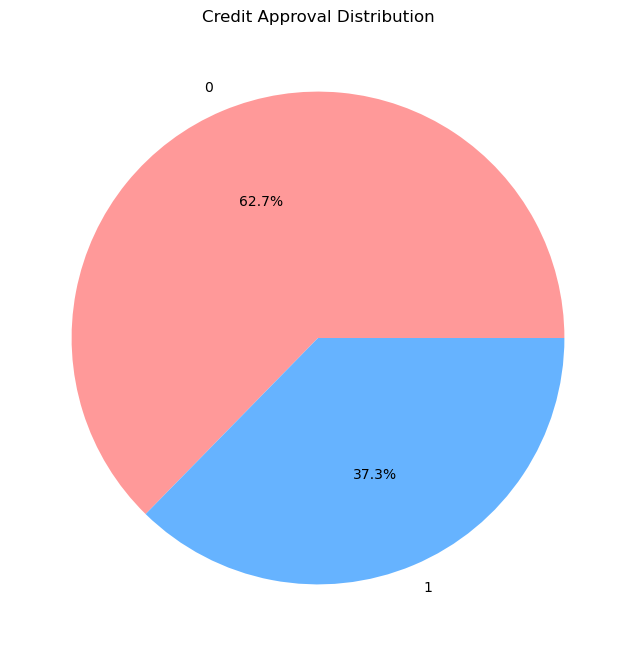

In [116]:
plt.figure(figsize=(8, 8))
y.value_counts().plot.pie(autopct='%1.1f%%', colors=['#ff9999', '#66b3ff'])
plt.title('Credit Approval Distribution')
plt.ylabel('')
plt.show()


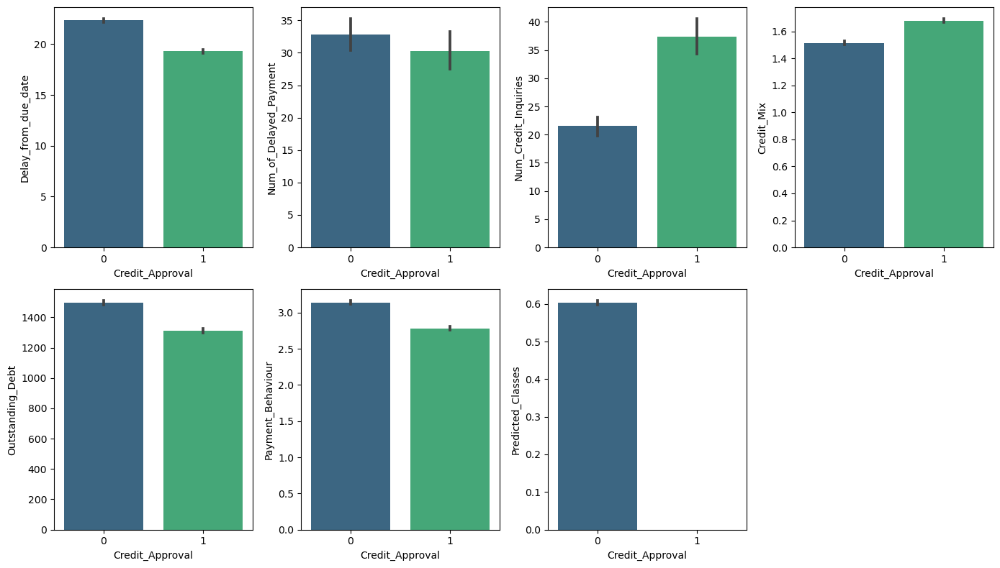

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'new_customer' is your DataFrame
plt.figure(figsize=(14, 8))

features_to_visualize = ['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt', 'Payment_Behaviour', 'Predicted_Classes']

for feature in features_to_visualize:
    plt.subplot(2, 4, features_to_visualize.index(feature) + 1)
    sns.barplot(x='Credit_Approval', y=feature, data=new_customer, palette='viridis')

plt.tight_layout()
plt.show()


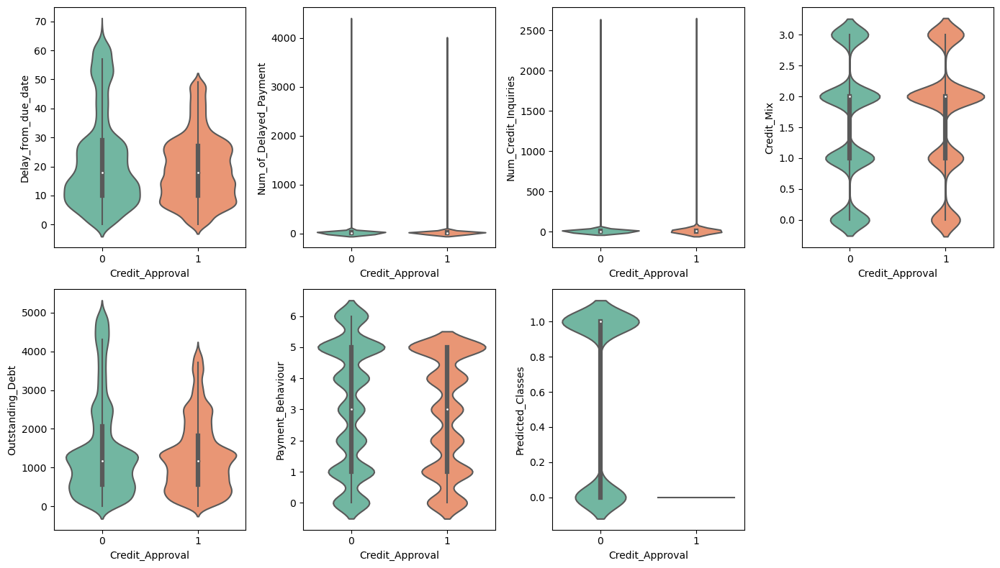

In [118]:
plt.figure(figsize=(14, 8))

for feature in features_to_visualize:
    plt.subplot(2, 4, features_to_visualize.index(feature) + 1)
    sns.violinplot(x='Credit_Approval', y=feature, data=new_customer, palette='Set2')

plt.tight_layout()
plt.show()


C:\Users\suyas\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


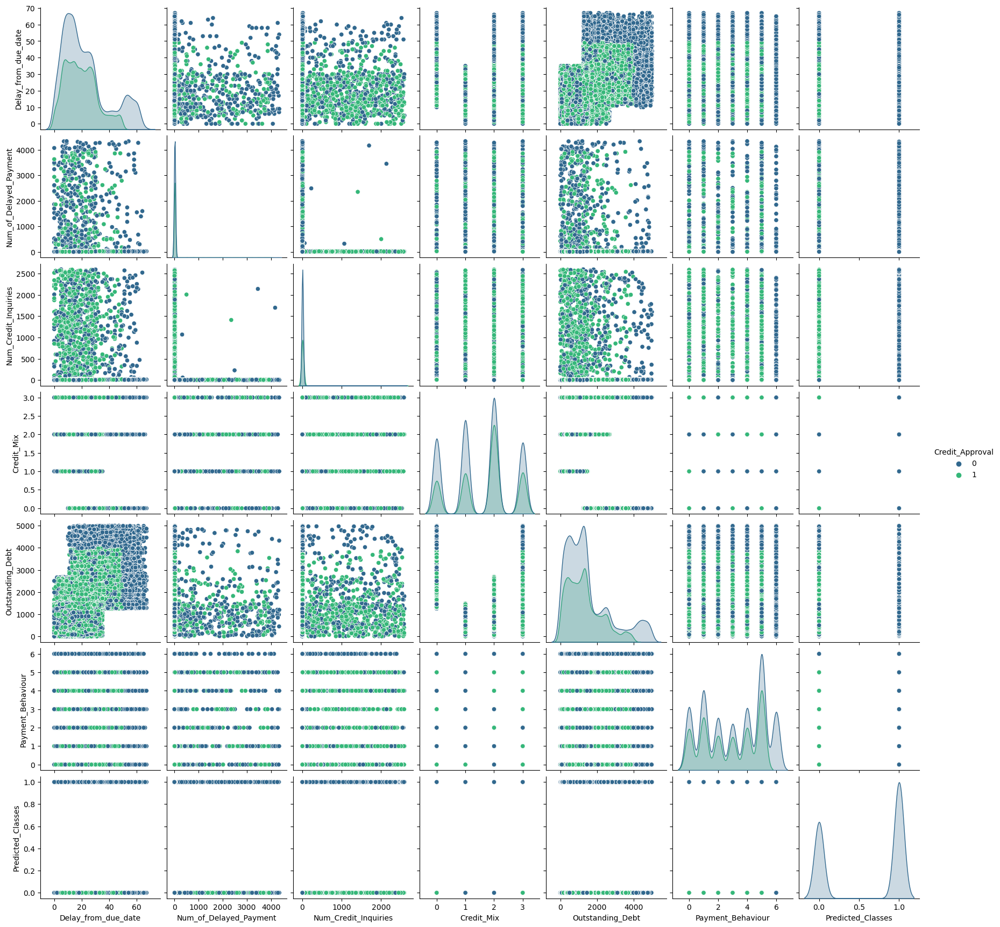

In [119]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'new_customer' is your DataFrame
features_to_visualize = ['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt', 'Payment_Behaviour', 'Predicted_Classes', 'Credit_Approval']

sns.pairplot(new_customer[features_to_visualize], hue='Credit_Approval', palette='viridis')
plt.show()
